The notebook includes the following sections:

<ol>
  <li>Preparation</li>
  <li>Data Import and Exploration</li>
    <ol>
      <li> Data Clean</li>
      <li> Mapping the Spatial Distribution of Complaints</li>
      <li> Checking the Stationarity of a time series(date) : Augmented Dicky-Fuller Test</li>
      <li> Seasonal_decompose</li>
    </ol>
  <li>Clustering based on Local Area Summarized Complaints
    <ol>
      <li> Clustering based on LSOA & Year_Month (Best Result)</li>
      <li> Clustering based on LSOA & Weekday</li>
      <li> Clustering based on LSOA & Hour</li>
      <li> Clustering based on LSOA & Date(Not Good)</li>
      <li> Clustering based on LSOA & Month(Not Good)</li>
    </ol>
  </li>
  <li>Repeat Complaints and their Location</li>
</ol>

I am sorry that there is a lot of repeat analysis steps in this notebook and it will be further optimized and simplified with the development of the project.

A most imporatant finding through the analysis is that a significant spatial-temporal pattern has been detected via the clustering analysis based on LSOA and the year-month series, which you can find on section 3. There are 4 different waving pattern of the complaints and their spatial distribution can be related to landuse and a serires of socio-economic contexts. I will test the relationship in this week. 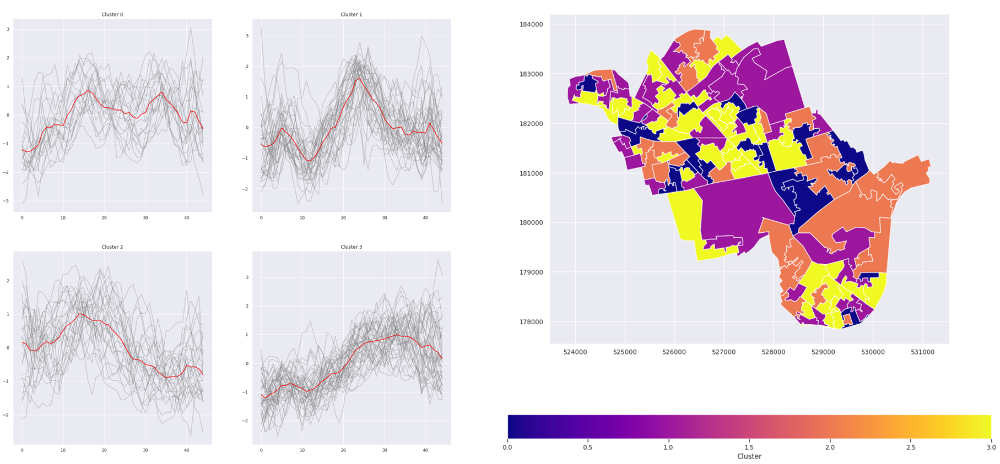

## 1.Preparation

In [1]:
pip install minisom

Note: you may need to restart the kernel to use updated packages.


In [2]:
# https://github.com/JustGlowing/minisom

In [3]:
pip install tslearn

Note: you may need to restart the kernel to use updated packages.


In [4]:
# https://tslearn.readthedocs.io/en/stable/index.html

In [5]:
pip install h5py

Note: you may need to restart the kernel to use updated packages.


In [6]:
! pip install tslearn
! pip uninstall scikit-learn --yes 
! pip install scikit-learn==0.24.1

Found existing installation: scikit-learn 0.24.1
Uninstalling scikit-learn-0.24.1:
  Successfully uninstalled scikit-learn-0.24.1
  Using cached scikit_learn-0.24.1-cp39-cp39-manylinux2010_x86_64.whl (23.8 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pysal 2.4.0 requires urllib3>=1.26, but you have urllib3 1.25.11 which is incompatible.
imbalanced-learn 0.9.1 requires scikit-learn>=1.1.0, but you have scikit-learn 0.24.1 which is incompatible.


In [7]:
# Native libraries
import os
import math
import warnings

# Essential Libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Preprocessing
from sklearn.preprocessing import MinMaxScaler

# Algorithms
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE, MDS
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram
from tqdm.autonotebook import tqdm

warnings.filterwarnings("ignore")
sns.set_style("darkgrid")

SEED=23


/tmp/ipykernel_71/2742390293.py:27: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## 2.Data Import and Exploration

## 2.1 Data Clean

In [8]:
noise_test = pd.read_csv('1_cleaned_data.csv')

In [9]:
# All the columns
noise_test.columns

Index(['Noise_Complaint_Index', 'Time', 'Received_Date', 'Financial_Year',
       'Service_Request', 'Service_Request_Group_Type',
       'Service_Request_Group_Sub_Type', 'Service_Request_1', 'Address_Key_',
       'Type_of_Address', 'Output_Area_Code_(2011)', 'MSOA_2011_Code',
       'MSOA_2011_Name', 'LSOA_2011_Code', 'LSOA_2011_Name', 'Ward_Name',
       'Date', 'Days', 'Year_Month', 'Year_Week', 'Year', 'Month', 'Weekday',
       'Season', 'days'],
      dtype='object')

In [10]:
len(noise_test.LSOA_2011_Code.unique())

163

In [11]:
noise_test.LSOA_2011_Code.unique()

array(['E01004736', 'E01004745', 'E01004667', 'E01004694', 'E01033596',
       'E01033607', 'E01004659', 'E01004675', 'E01004762', 'E01004714',
       'E01004747', 'E01004761', 'E01004723', 'E01004763', 'E01032512',
       'E01004654', 'E01004765', 'E01004720', 'E01004734', 'E01004735',
       'E01033601', 'E01033595', 'E01004653', 'E01004687', 'E01004713',
       'E01004738', 'E01004658', 'E01004715', 'E01004718', '0',
       'E01004656', 'E01033608', 'E01004717', 'E01004646', 'E01033602',
       'E01004681', 'E01004678', 'E01004661', 'E01004688', 'E01004744',
       'E01033604', 'E01004702', 'E01004721', 'E01033593', 'E01004696',
       'E01004741', 'E01004666', 'E01004707', 'E01004683', 'E01004699',
       'E01004732', 'E01004682', 'E01004668', 'E01004669', 'E01004657',
       'E01004703', 'E01004750', 'E01004729', 'E01004756', 'E01004722',
       'E01004708', 'E01033598', 'E01004730', 'E01002818', 'E01004740',
       'E01004733', 'E01004695', 'E01033594', 'E01004698', 'E01004674',


In [12]:
# There are a series of complaints not belonging to Westminster
# Select only the records in Westminster and in the sub group of 'Noise Complaint'
lsoanot = ['Brent 032E', 'Brent 034B', 'Camden 017C', 'Camden 017D',
       'Camden 018D', 'Camden 020A', 'Camden 020B', 'Camden 020D',
       'Camden 026A', 'Camden 026B', 'Camden 026D', 'Camden 028A',
       'Camden 028B', 'Camden 028C', 'Camden 028D',
       'Hammersmith and Fulham 020E', 'Hammersmith and Fulham 024A',
       'Kensington and Chelsea 001A', 'Kensington and Chelsea 001C',
       'Kensington and Chelsea 001E', 'Kensington and Chelsea 004A',
       'Kensington and Chelsea 004B', 'Kensington and Chelsea 004D',
       'Kensington and Chelsea 006D', 'Kensington and Chelsea 006E',
       'Kensington and Chelsea 010E', 'Kensington and Chelsea 012A',
       'Kensington and Chelsea 012B', 'Kensington and Chelsea 012C',
       'Kensington and Chelsea 012E', 'Kensington and Chelsea 018C',
       'Kensington and Chelsea 018D', 'Southwark 024A']

noise_test_true = noise_test.loc[(noise_test.Service_Request_Group_Type == 'Noise Complaint')&(noise_test.LSOA_2011_Name  != '0')& (~noise_test.LSOA_2011_Name.isin(lsoanot) )]
noise_test_true

,Noise_Complaint_Index,Time,Received_Date,Financial_Year,Service_Request,Service_Request_Group_Type,Service_Request_Group_Sub_Type,Service_Request_1,Address_Key_,Type_of_Address,...,Ward_Name,Date,Days,Year_Month,Year_Week,Year,Month,Weekday,Season,days
0,NC1,0,4/1/2018,2018/19,Burglar/fire alarm,Noise Complaint,Property Alarm,Burglar/fire alarm,AD1,ADDRESS,...,St James's,2018-04-01,0,2018-04,2018-13,2018,4,6,2,0
1,NC2,0,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD2,ADDRESS,...,Vincent Square,2018-04-01,0,2018-04,2018-13,2018,4,6,2,0
2,NC3,0,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD3,ADDRESS,...,Knightsbridge & Belgravia,2018-04-01,0,2018-04,2018-13,2018,4,6,2,0
3,NC4,0,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD4,ADDRESS,...,Lancaster Gate,2018-04-01,0,2018-04,2018-13,2018,4,6,2,0
4,NC5,2,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD5,ADDRESS,...,West End,2018-04-01,0,2018-04,2018-13,2018,4,6,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90793,NC90794,22,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD27872,ADDRESS,...,West End,2022-05-24,0,2022-05,2022-21,2022,5,1,2,1514
90794,NC90795,23,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD27873,ADDRESS,...,Lancaster Gate,2022-05-24,0,2022-05,2022-21,2022,5,1,2,1514
90795,NC90796,23,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD6625,ADDRESS,...,West End,2022-05-24,0,2022-05,2022-21,2022,5,1,2,1514
90796,NC90797,23,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD26114,ADDRESS,...,Bayswater,2022-05-24,0,2022-05,2022-21,2022,5,1,2,1514


In [13]:
# simple is the best
noise_test_true.Service_Request_Group_Sub_Type.unique()

array(['Property Alarm', 'Residential Premises', 'Commercial Premises',
       'Building Site', 'Street', 'Non Noise Complaint (45m)',
       'Email Complaint (1d)'], dtype=object)

## 2.2 Mapping the Spatial Distribution of Complaints

* Summarize the complaints with lsoa 

In [14]:
# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa = noise_test_true.groupby(['LSOA_2011_Name']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa

,LSOA_2011_Name,Noise_Complaint_Index
0,Westminster 001A,437
1,Westminster 001B,175
2,Westminster 001C,548
3,Westminster 001D,255
4,Westminster 002A,326
...,...,...
123,Westminster 024B,580
124,Westminster 024C,148
125,Westminster 024D,208
126,Westminster 024E,56


In [15]:
# join the dataframe with map

In [16]:
lsoa_gdf = gpd.read_file("data_within_Westminster/westminster_lsoa_boundary.shp", driver = 'shp')
#lsoa_gdf = gpd.read_file("data_within_Westminster/LSOA_2011_London_gen_MHW.gpkg", driver = 'gpkg')

noise_test_true_summary_lsoa_gdf = lsoa_gdf.merge(noise_test_true_summary_lsoa, left_on = 'LSOA11NM', right_on = 'LSOA_2011_Name' )

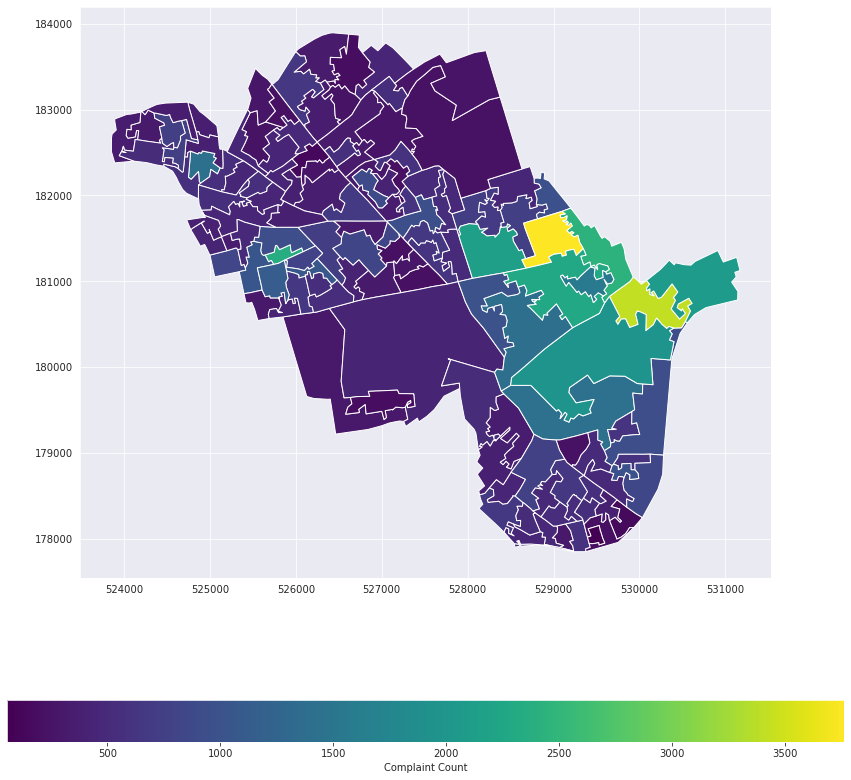

In [17]:
# Plot the count of complaints for each lsoa
# It is found that most areas has a record count at 500 level
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

noise_test_true_summary_lsoa_gdf.plot(column='Noise_Complaint_Index', ax=ax, cmap = 'viridis', legend=True,legend_kwds={'label': "Complaint Count",
                        'orientation': "horizontal"});

## 2.3 Checking the Stationarity of a time series(date) : Augmented Dicky-Fuller Test

In [18]:
# Summarize by date
noise_test_summary_date = noise_test_true.groupby('Date').count()[['Noise_Complaint_Index']].reset_index()
noise_test_summary_date

,Date,Noise_Complaint_Index
0,2018-04-01,32
1,2018-04-02,33
2,2018-04-03,28
3,2018-04-04,40
4,2018-04-05,38
...,...,...
1510,2022-05-20,40
1511,2022-05-21,55
1512,2022-05-22,49
1513,2022-05-23,45


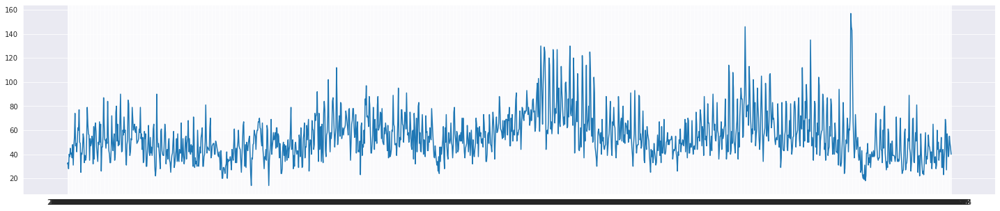

In [19]:
fig, ax = plt.subplots(figsize=(25, 5))
ax.plot(noise_test_summary_date.Date, noise_test_summary_date.Noise_Complaint_Index);

In [20]:
noise_test_summary_date = noise_test_summary_date.set_index('Date') 

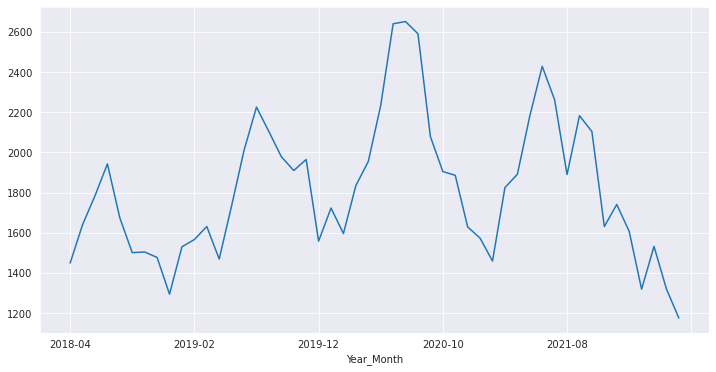

In [21]:
## Year-Month
# noise_test.groupby(['Year_Month']).count()['Noise_Complaint_Index'].plot(figsize=(12,6), kind='line');
## Year-Month
noise_test.groupby(['Year_Month']).count()['Noise_Complaint_Index'].plot(figsize=(12,6), kind='line');

It is a type of test called a unit root test. It tries to determine how strongly a time series is defined by a trend using a auto-regressive model and optimizes an information criterion across multiple different lag values.

Null Hypothesis (H0): is that the time series can be represented by a unit root (i.e. it is not stationary)


Alternate Hypotheis (H1): is that the time series does not have a unit root (i.e. it is stationary). Null Hypothesis is rejected.


The results are interpreted using the p-value. A p-value below a threshold (here 0.05) means we reject the H0 and a p-value above it means we accept the H0.


For this study, the p-value obtained is 0.003204, less than the significance level (say 0.05).  Thereby, inferring that the series is stationary.

https://www.kaggle.com/code/ashmib/time-series-forecast-australian-beer-production

In [22]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(30).mean()
    rolstd = timeseries.rolling(30).std()
    plt.figure(figsize=(20, 10))
    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original', )
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    

    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

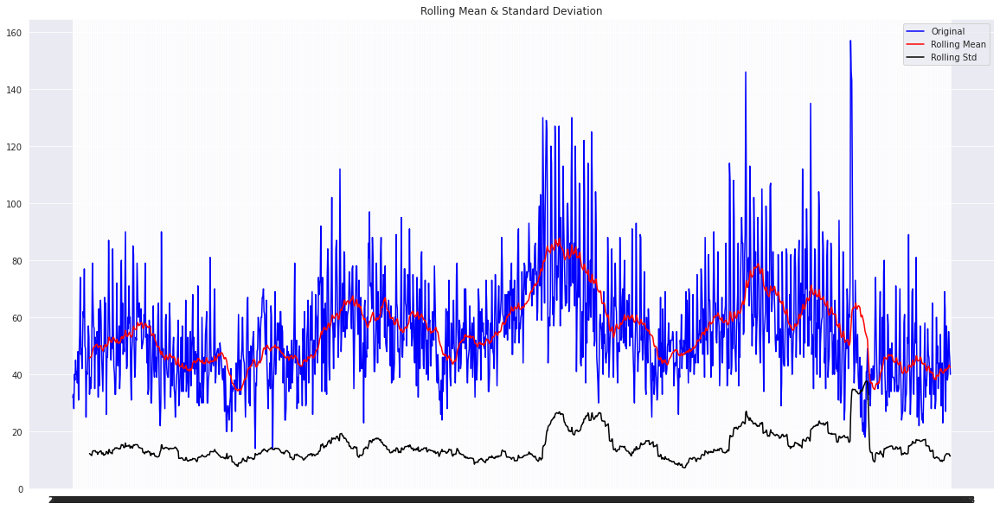

Results of Dickey-Fuller Test:
Test Statistic                   -3.348046
p-value                           0.012863
#Lags Used                       24.000000
Number of Observations Used    1490.000000
Critical Value (1%)              -3.434746
Critical Value (5%)              -2.863482
Critical Value (10%)             -2.567804
dtype: float64


In [23]:
test_stationarity(noise_test_summary_date)

In [24]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(noise_test_summary_date["Noise_Complaint_Index"])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))
    
# here we reject the H0, the time series is stationary.

ADF Statistic: -3.348046
p-value: 0.012863
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568


## 2.4 Seasonal Decompose

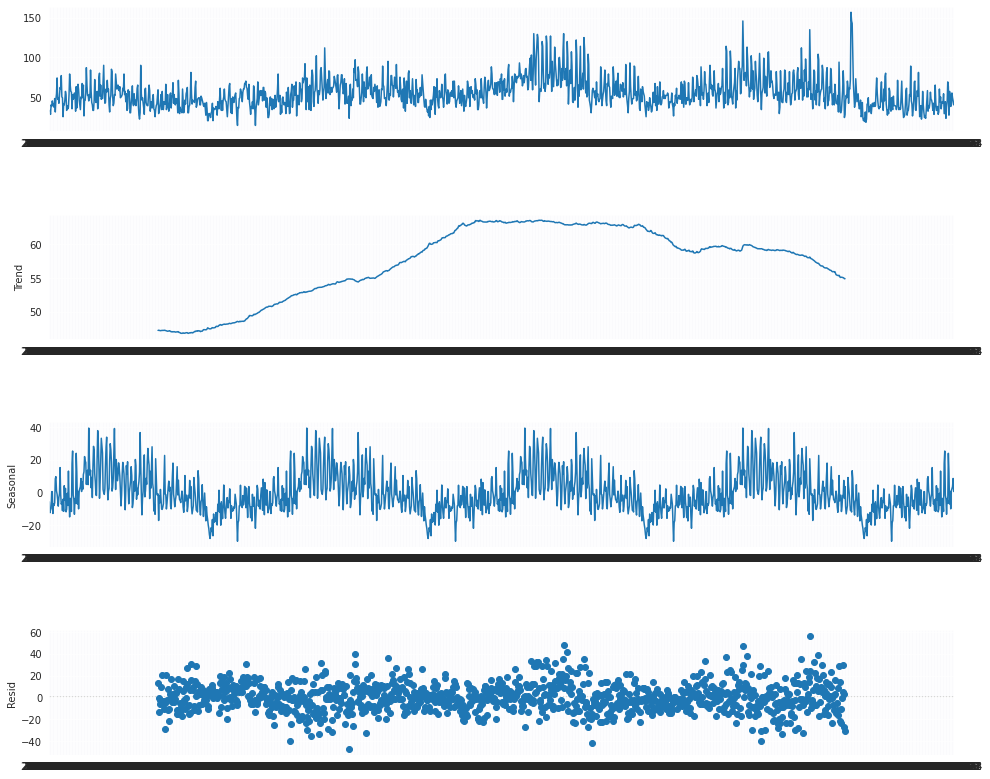

In [25]:
from statsmodels.tsa.seasonal import seasonal_decompose

#noise_test_summary_date.set_index('Date', inplace=True)

analysis = noise_test_summary_date[['Noise_Complaint_Index']].copy()

# Take seasons as freq,
#decompose_result_mult = seasonal_decompose(analysis, model="multiplicative", freq=90)
decompose_result_mult = seasonal_decompose(analysis, model="additive", freq= 365)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

fig = decompose_result_mult.plot()
fig.set_size_inches((16, 12))

## 3. Clustering based on Local Area Summarized Complaints

Below is a series attempts to cluster the time-series of complaints complaints aggregated based on LSOA.

## 3.1 Clustering based on LSOA & Year_Month

## 3.1.1 LSOA & Year_Month_Baseline Model

In [26]:
noise_test_true['Category_by'] = noise_test_true['Year_Month'] 

In [27]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04,Westminster 001A,2018-04,6
2018-05,Westminster 001A,2018-05,5
2018-06,Westminster 001A,2018-06,6
2018-07,Westminster 001A,2018-07,9
2018-08,Westminster 001A,2018-08,11
...,...,...,...
2022-01,Westminster 024F,2022-01,2
2022-02,Westminster 024F,2022-02,1
2022-03,Westminster 024F,2022-03,2


In [28]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]
    series.append(df)

In [29]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)

{42, 44, 45, 46, 47, 48, 49, 50, 29}


In [30]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [31]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [32]:
for i in range(len(series)):
    series[i]['Noise_Complaint_Index'] = series[i]['Noise_Complaint_Index'].fillna(0)
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)

In [33]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name'], axis = 1)

In [34]:
# min-max transform
for i in range(len(series_test)):
    scaler = MinMaxScaler()
    series[i] = MinMaxScaler().fit_transform(series[i])
    series[i] = series[i].reshape(len(series[i]))

In [35]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 6
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(series_test)

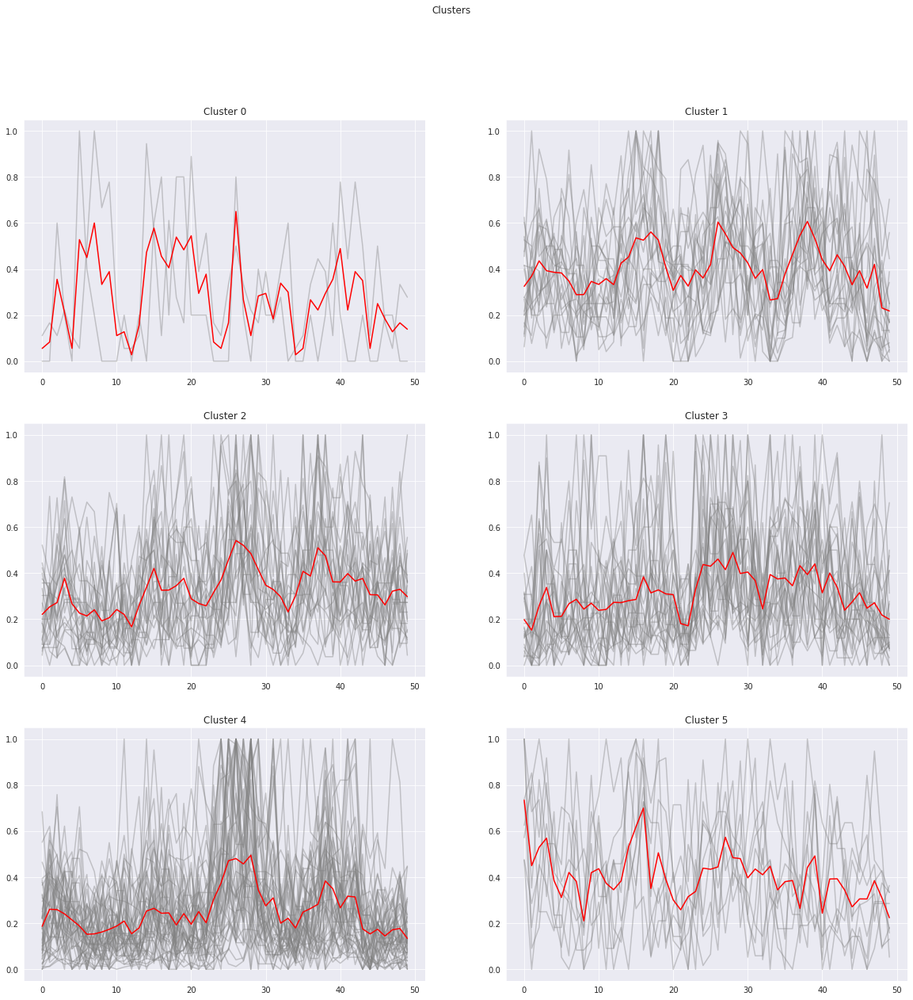

In [36]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(3,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

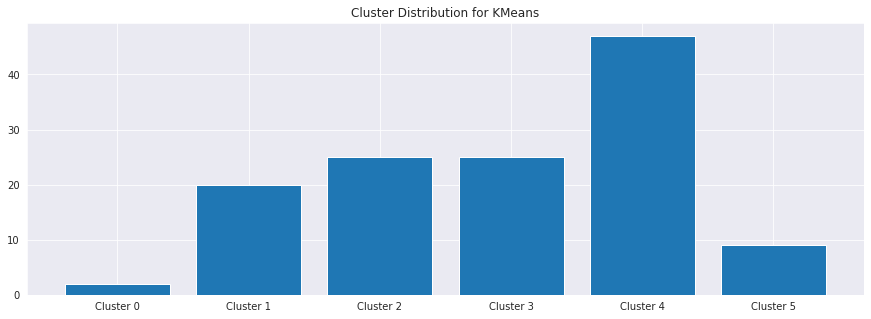

In [37]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [38]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [39]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [40]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

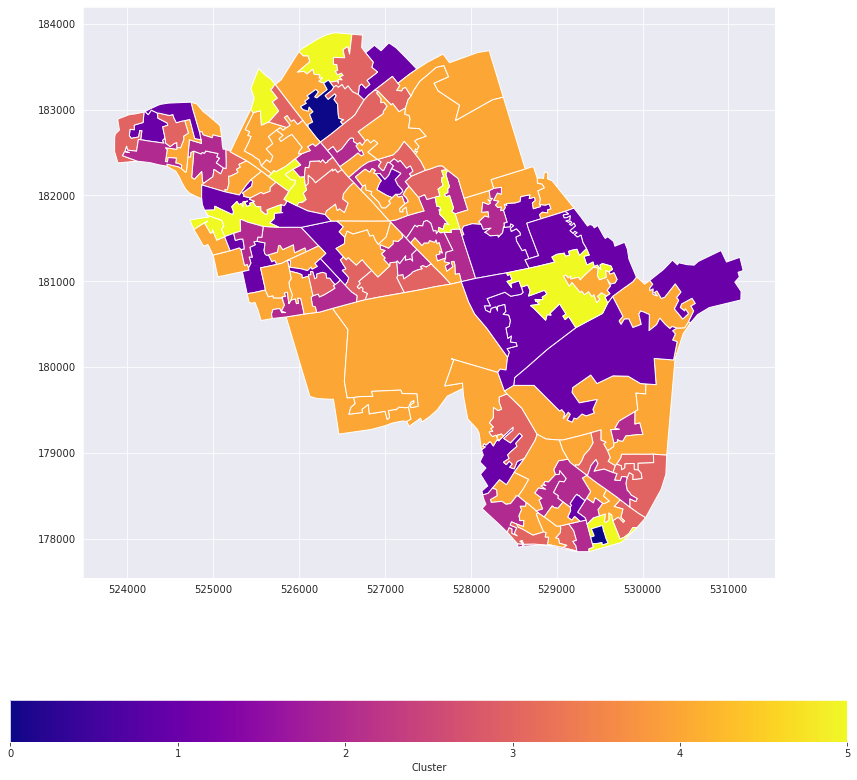

In [41]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.1.2 LSOA & Year_Month_Smooth

In [42]:
noise_test_true['Category_by'] = noise_test_true['Year_Month'] 

In [43]:

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04,Westminster 001A,2018-04,6
2018-05,Westminster 001A,2018-05,5
2018-06,Westminster 001A,2018-06,6
2018-07,Westminster 001A,2018-07,9
2018-08,Westminster 001A,2018-08,11
...,...,...,...
2022-01,Westminster 024F,2022-01,2
2022-02,Westminster 024F,2022-02,1
2022-03,Westminster 024F,2022-03,2


In [44]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [45]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{42, 44, 45, 46, 47, 48, 49, 50, 29}


In [46]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [47]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)


* rooling_mean
* interpolate
* fillna - bfill

In [48]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [49]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']

In [50]:
# min-max transform
for i in range(len(series_test)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test[i] = StandardScaler().fit_transform(series_test[i])
    series_test[i] = series_test[i].reshape(len(series_test[i]))

In [51]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 33.1 s, sys: 21.6 s, total: 54.7 s
Wall time: 30 s


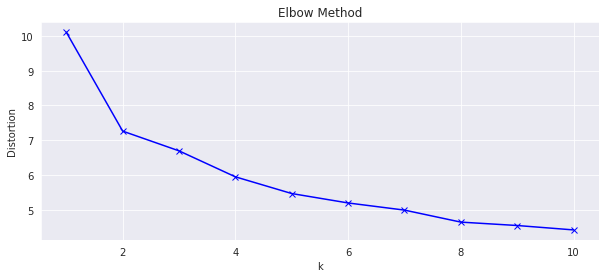

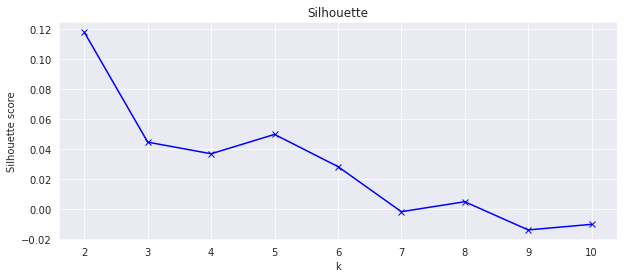

In [52]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test, max_clusters=10, metric='dtw', seed=SEED)

In [53]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 8.28 s, sys: 1.91 s, total: 10.2 s
Wall time: 3.1 s


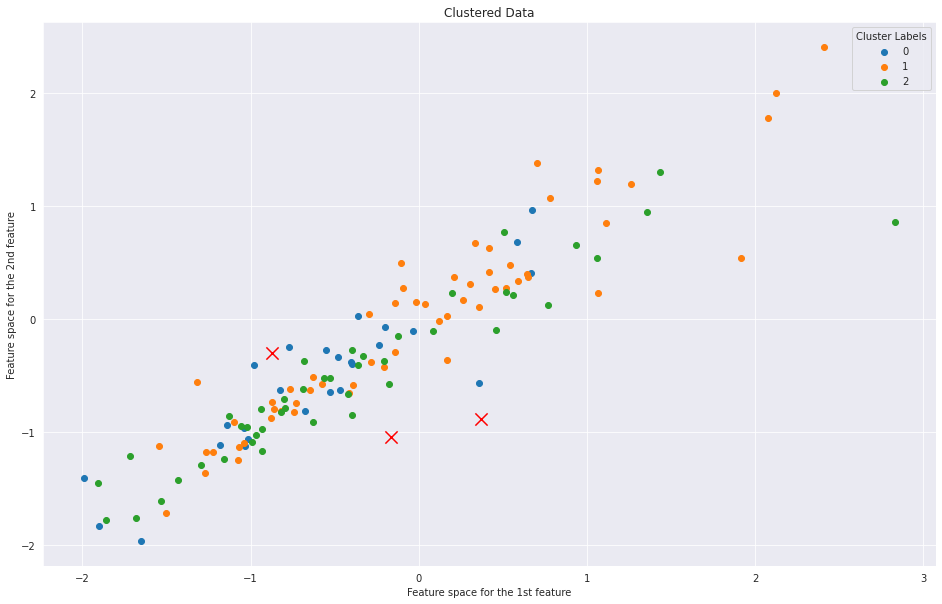

In [54]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

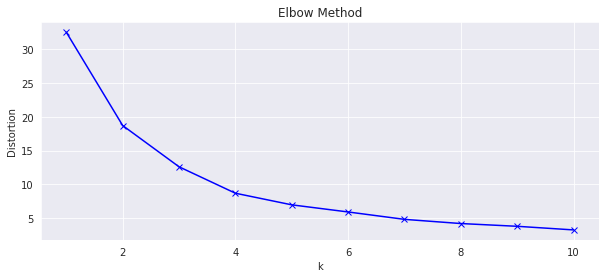

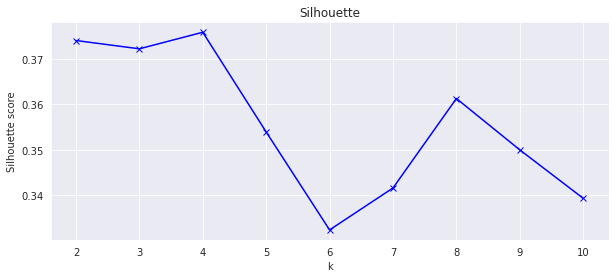

In [55]:
mds = MDS(n_components=2, n_init=4, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [56]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 4
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

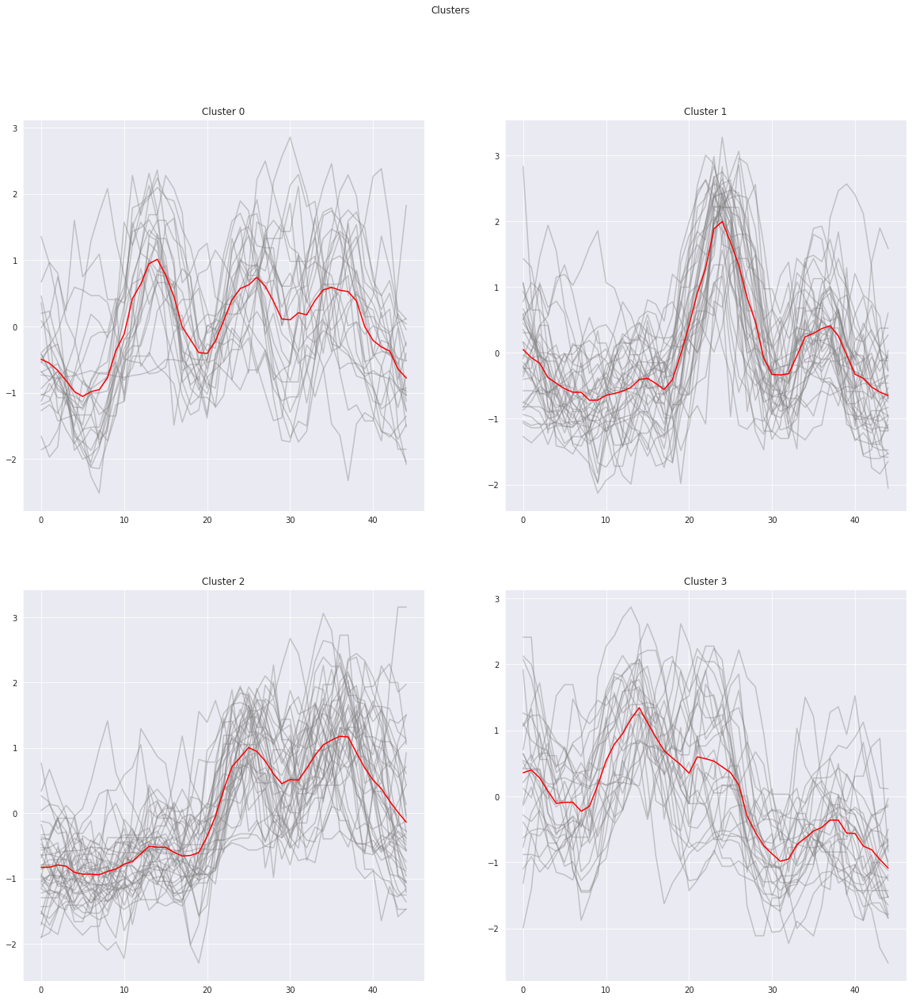

In [57]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

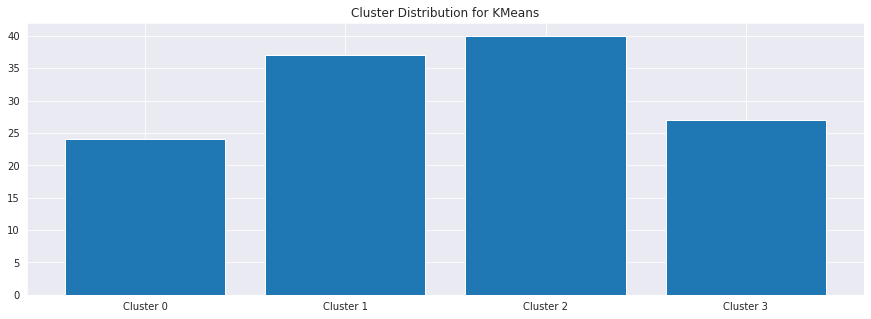

In [58]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [59]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [60]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [61]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

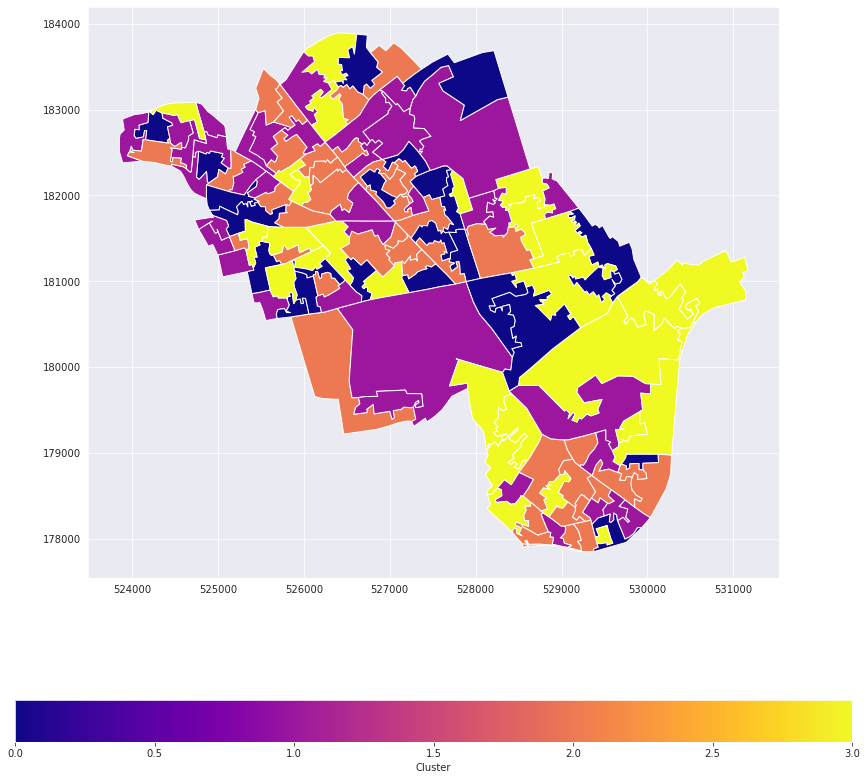

In [62]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

good result!

## 3.1.3 LSOA & Year_Month_Smooth_reduce_seasonality

In [63]:
# 接着要进一步除去 seasonality, 只聚类时间

In [64]:
noise_test_true['Category_by'] = noise_test_true['Year_Month'] 


In [65]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time = 

SyntaxError: invalid syntax (1824592868.py, line 7)

In [ ]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [ ]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


In [ ]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [ ]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [ ]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [ ]:
series[1].head()

In [ ]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']
series_test[1].head()

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

#noise_test_summary_date.set_index('Date', inplace=True)

series_test_de = series_test.copy()

list_trend = []
list_seasonal = []
list_residual = []

# Take seasons as freq,
#decompose_result_mult = seasonal_decompose(analysis, model="multiplicative", freq=90)
for i in range(len(series_test_de)):
    decompose_result_mult = seasonal_decompose(series_test_de[i], model="additive", freq= 12)
    trend = decompose_result_mult.trend
    seasonal = decompose_result_mult.seasonal
    residual = decompose_result_mult.resid
    list_trend.append(trend)
    list_seasonal.append(seasonal)
    list_residual.append(residual)
    series_test_de[i]['smoth_6'] = series_test_de[i]['smoth_6'] - seasonal

fig = decompose_result_mult.plot()
fig.set_size_inches((16, 12))

In [ ]:
# min-max transform
for i in range(len(series_test_de)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test_de[i] = StandardScaler().fit_transform(series_test_de[i])
    series_test_de[i] = series_test_de[i].reshape(len(series_test_de[i]))


In [ ]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

In [ ]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test_de, max_clusters=10, metric='dtw', seed=SEED)

In [ ]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

In [ ]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test_de),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

In [ ]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test_de) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [ ]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 4
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

In [ ]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_test_de[i],c="gray",alpha=0.4)
                cluster.append(series_test_de[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

In [ ]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [ ]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [ ]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [ ]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

In [ ]:
noise_test_true

## 3.1.4 LSOA & Year_Month_Smooth_reduce_seasonality_Residential

In [1028]:
# 接着要进一步除去 seasonality, 只聚类时间

In [1032]:
noise_test_true['Category_by'] = noise_test_true['Year_Month'] 


In [1033]:
# select only residential 

#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Street']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Commercial Premises']
noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Residential Premises']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Property Alarm']

noise_test_true_summary_lsoa_time = noise_test_true_summary_lsoa_time.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time 

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04,Westminster 001A,2018-04,2
2018-05,Westminster 001A,2018-05,1
2018-06,Westminster 001A,2018-06,1
2018-07,Westminster 001A,2018-07,4
2018-08,Westminster 001A,2018-08,4
...,...,...,...
2022-01,Westminster 024F,2022-01,1
2022-02,Westminster 024F,2022-02,1
2022-03,Westminster 024F,2022-03,2


In [1034]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

#noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
#noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
#noise_test_true_summary_lsoa_time 

In [1035]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [1036]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 24}


In [1037]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [1038]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [1039]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [1040]:
series[1].head()

,LSOA_2011_Name,Noise_Complaint_Index,smoth_6
Category_by,,,
2018-09,Westminster 001B,1.0,1.750000
2018-10,Westminster 001B,2.0,1.916667
2018-11,Westminster 001B,2.0,2.000000
2018-12,Westminster 001B,1.0,1.833333
2019-01,Westminster 001B,15.0,4.166667


In [1041]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']
series_test[1].head()

,smoth_6
Category_by,
2018-09,1.750000
2018-10,1.916667
2018-11,2.000000
2018-12,1.833333
2019-01,4.166667


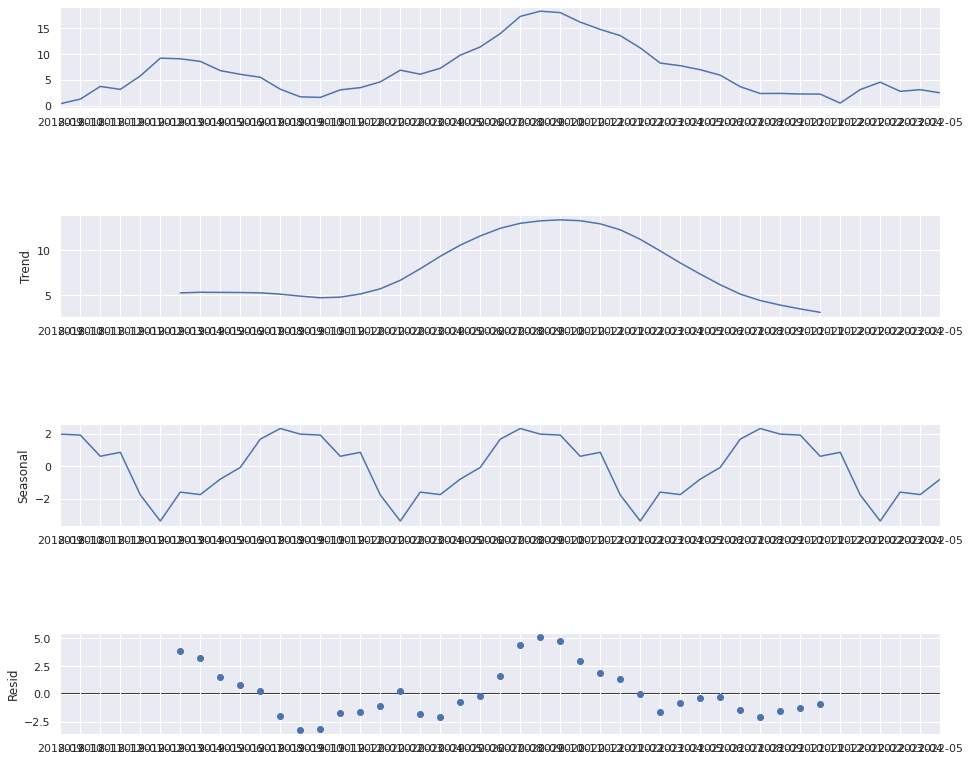

In [1042]:
from statsmodels.tsa.seasonal import seasonal_decompose

#noise_test_summary_date.set_index('Date', inplace=True)

series_test_de = series_test.copy()

list_trend = []
list_seasonal = []
list_residual = []

# Take seasons as freq,
#decompose_result_mult = seasonal_decompose(analysis, model="multiplicative", freq=90)
for i in range(len(series_test_de)):
    decompose_result_mult = seasonal_decompose(series_test_de[i], model="additive", freq= 12)
    trend = decompose_result_mult.trend
    seasonal = decompose_result_mult.seasonal
    residual = decompose_result_mult.resid
    list_trend.append(trend)
    list_seasonal.append(seasonal)
    list_residual.append(residual)
    series_test_de[i]['smoth_6'] = series_test_de[i]['smoth_6'] - seasonal

fig = decompose_result_mult.plot()
fig.set_size_inches((16, 12))

In [1043]:
# min-max transform
for i in range(len(series_test_de)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test_de[i] = StandardScaler().fit_transform(series_test_de[i])
    series_test_de[i] = series_test_de[i].reshape(len(series_test_de[i]))


In [1044]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 26.2 s, sys: 23.2 s, total: 49.5 s
Wall time: 26.4 s


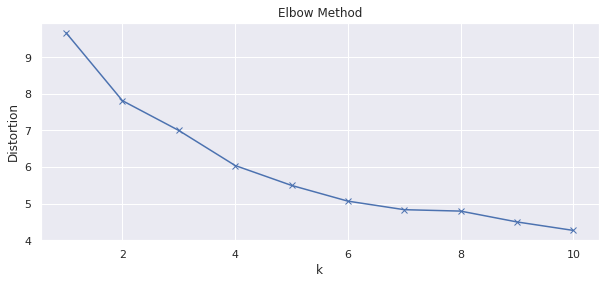

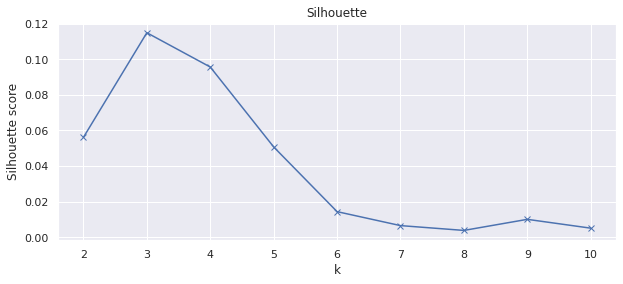

In [1045]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test_de, max_clusters=10, metric='dtw', seed=SEED)

In [1046]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 9.88 s, sys: 1.68 s, total: 11.6 s
Wall time: 2.6 s


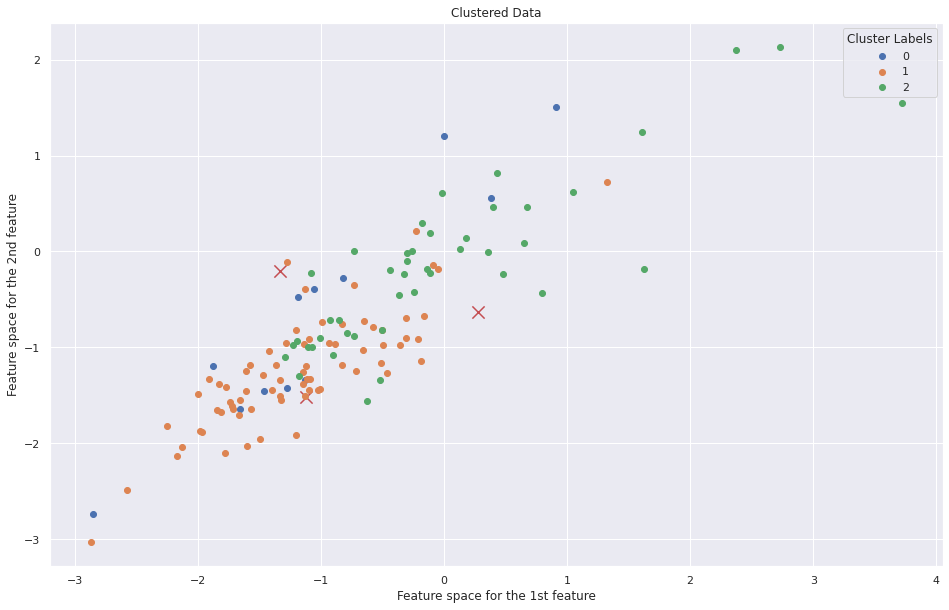

In [1047]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test_de),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

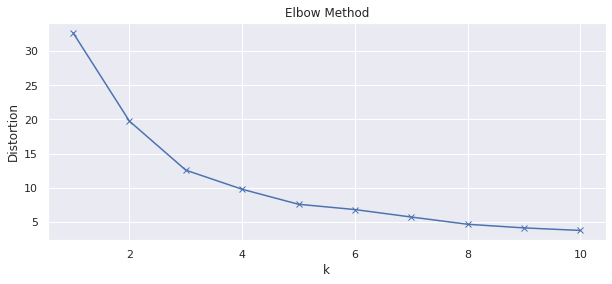

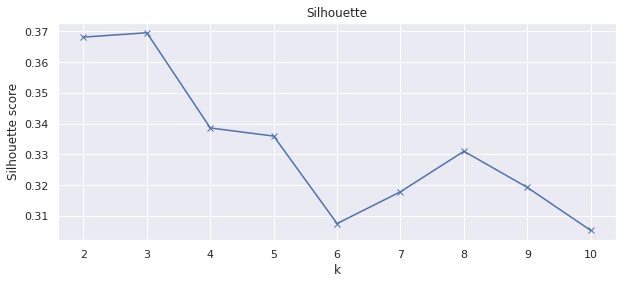

In [1048]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test_de) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [1063]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 3
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

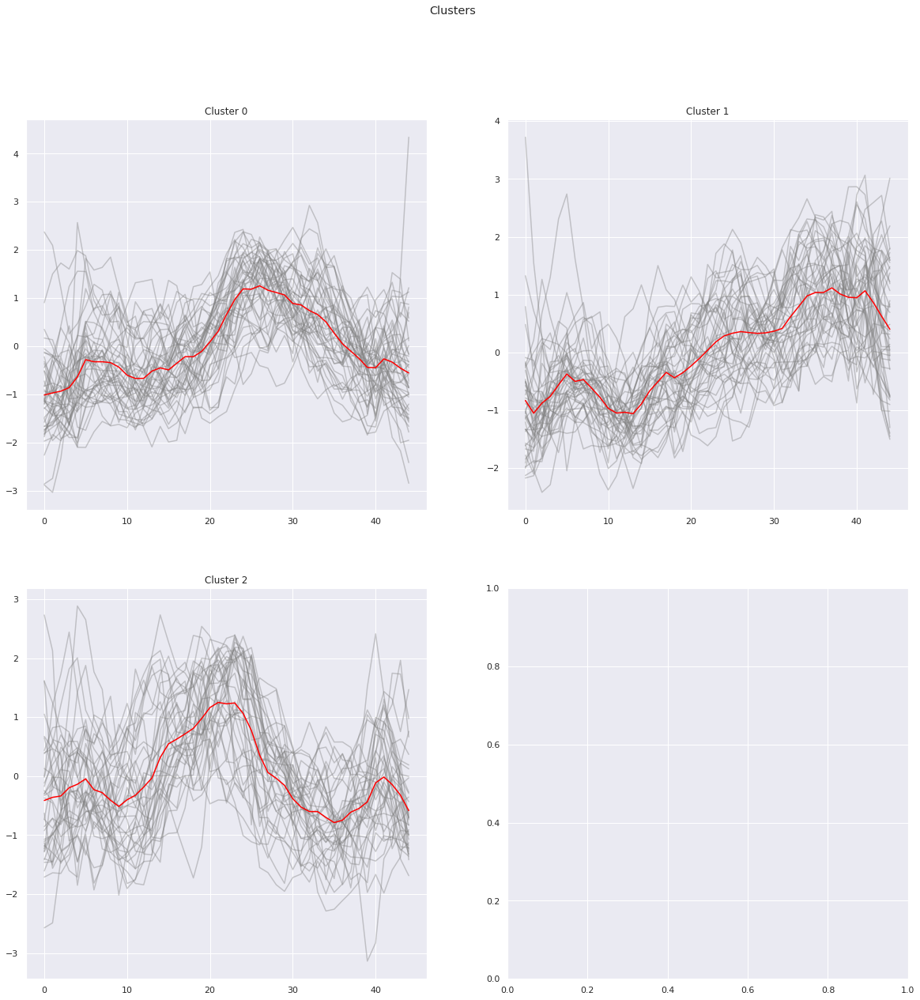

In [1064]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_test_de[i],c="gray",alpha=0.4)
                cluster.append(series_test_de[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

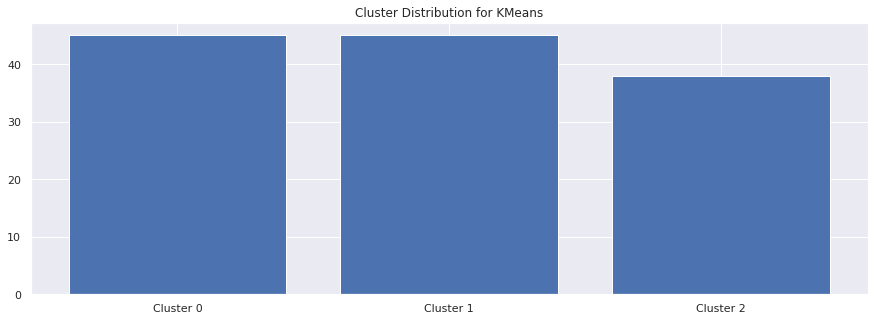

In [1065]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [1066]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [1067]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [1068]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

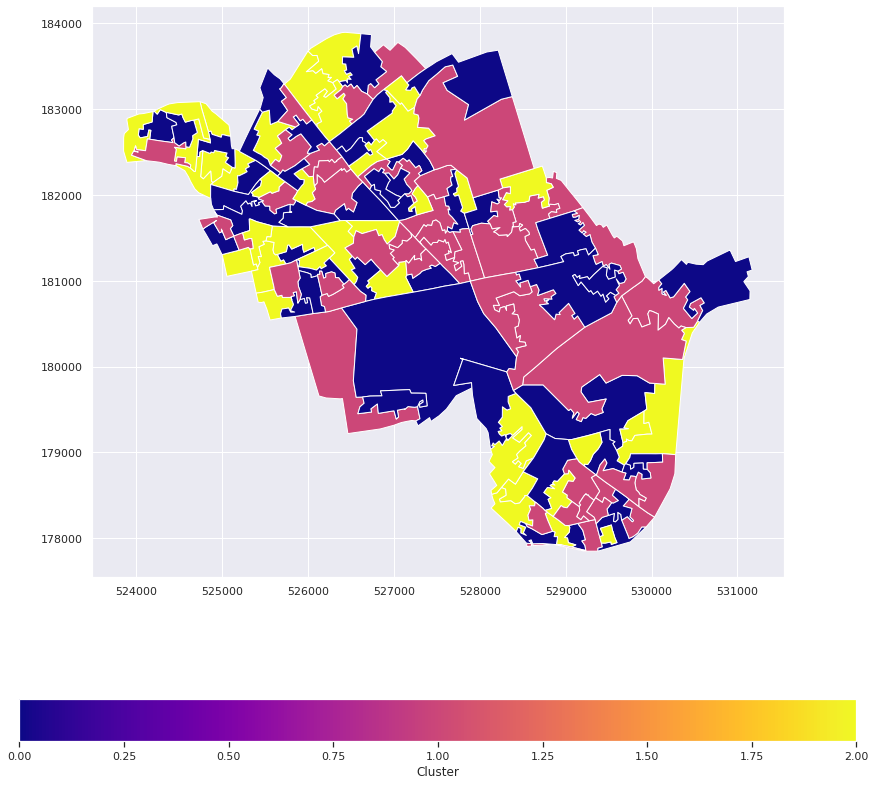

In [1069]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.1.5 LSOA & Year_Month_Smooth_reduce_seasonality_Commercial

In [1028]:
# 接着要进一步除去 seasonality, 只聚类时间

In [1070]:
noise_test_true['Category_by'] = noise_test_true['Year_Month'] 


In [1071]:
# select only residential 

#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Street']
noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Commercial Premises']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Residential Premises']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Property Alarm']

noise_test_true_summary_lsoa_time = noise_test_true_summary_lsoa_time.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time 

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04,Westminster 001A,2018-04,1
2018-05,Westminster 001A,2018-05,2
2018-06,Westminster 001A,2018-06,2
2018-07,Westminster 001A,2018-07,1
2018-08,Westminster 001A,2018-08,4
...,...,...,...
2020-09,Westminster 024E,2020-09,1
2020-02,Westminster 024F,2020-02,1
2020-04,Westminster 024F,2020-04,1


In [1072]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

#noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
#noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
#noise_test_true_summary_lsoa_time 

In [1073]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [1074]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50}


In [1075]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [1076]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [1077]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [1078]:
series[1].head()

,LSOA_2011_Name,Noise_Complaint_Index,smoth_6
Category_by,,,
2018-09,Westminster 001B,1.0,1.666667
2018-10,Westminster 001B,1.0,1.666667
2018-11,Westminster 001B,1.0,1.666667
2018-12,Westminster 001B,1.0,1.666667
2019-01,Westminster 001B,1.0,1.000000


In [1079]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']
series_test[1].head()

,smoth_6
Category_by,
2018-09,1.666667
2018-10,1.666667
2018-11,1.666667
2018-12,1.666667
2019-01,1.000000


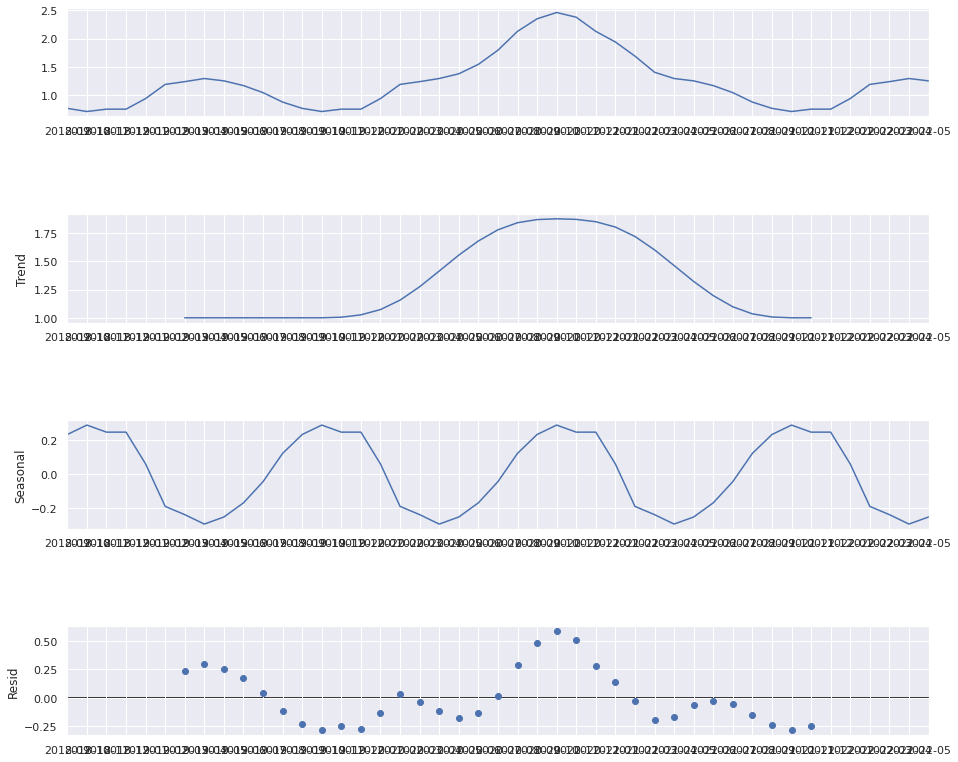

In [1080]:
from statsmodels.tsa.seasonal import seasonal_decompose

#noise_test_summary_date.set_index('Date', inplace=True)

series_test_de = series_test.copy()

list_trend = []
list_seasonal = []
list_residual = []

# Take seasons as freq,
#decompose_result_mult = seasonal_decompose(analysis, model="multiplicative", freq=90)
for i in range(len(series_test_de)):
    decompose_result_mult = seasonal_decompose(series_test_de[i], model="additive", freq= 12)
    trend = decompose_result_mult.trend
    seasonal = decompose_result_mult.seasonal
    residual = decompose_result_mult.resid
    list_trend.append(trend)
    list_seasonal.append(seasonal)
    list_residual.append(residual)
    series_test_de[i]['smoth_6'] = series_test_de[i]['smoth_6'] - seasonal

fig = decompose_result_mult.plot()
fig.set_size_inches((16, 12))

In [1081]:
# min-max transform
for i in range(len(series_test_de)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test_de[i] = StandardScaler().fit_transform(series_test_de[i])
    series_test_de[i] = series_test_de[i].reshape(len(series_test_de[i]))


In [1082]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 26.9 s, sys: 23.7 s, total: 50.6 s
Wall time: 26.9 s


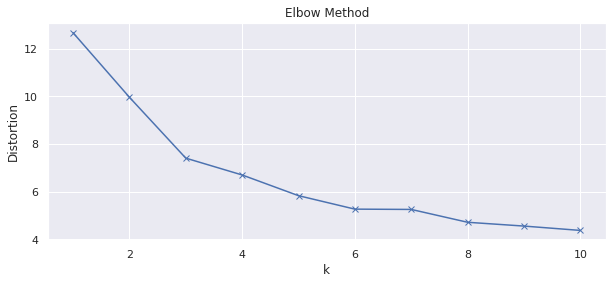

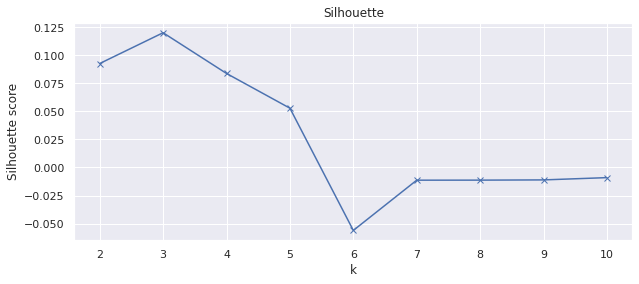

In [1083]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test_de, max_clusters=10, metric='dtw', seed=SEED)

In [1084]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 9.53 s, sys: 1.25 s, total: 10.8 s
Wall time: 2.65 s


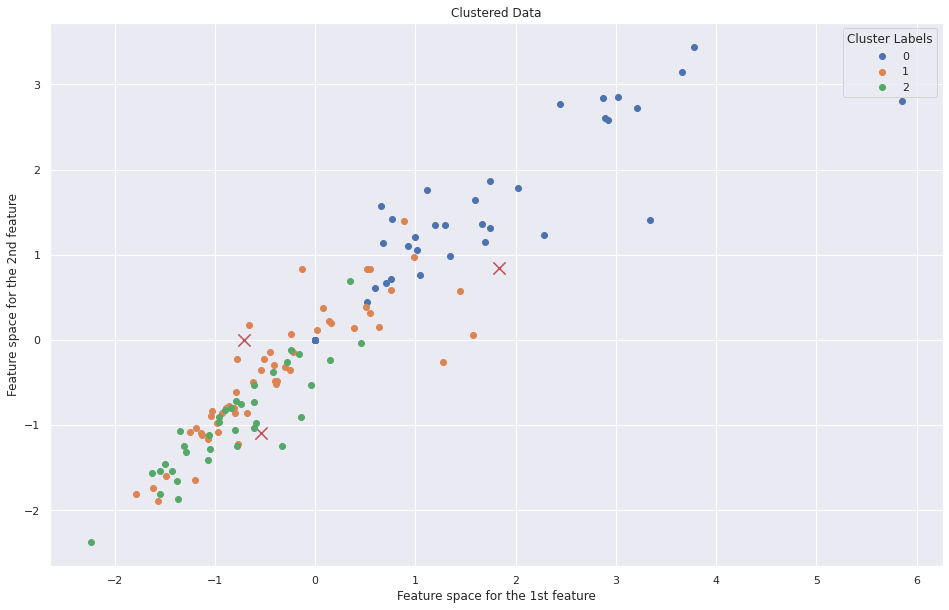

In [1085]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test_de),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

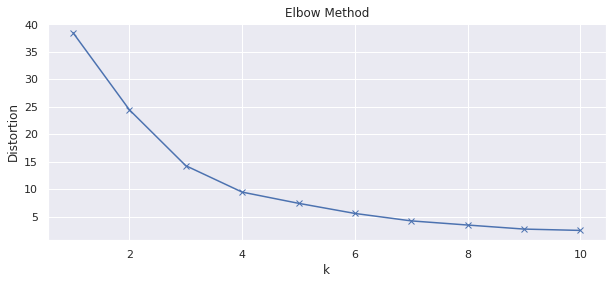

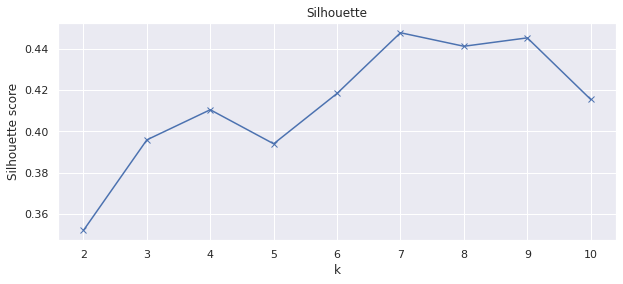

In [1086]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test_de) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [1102]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 4
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

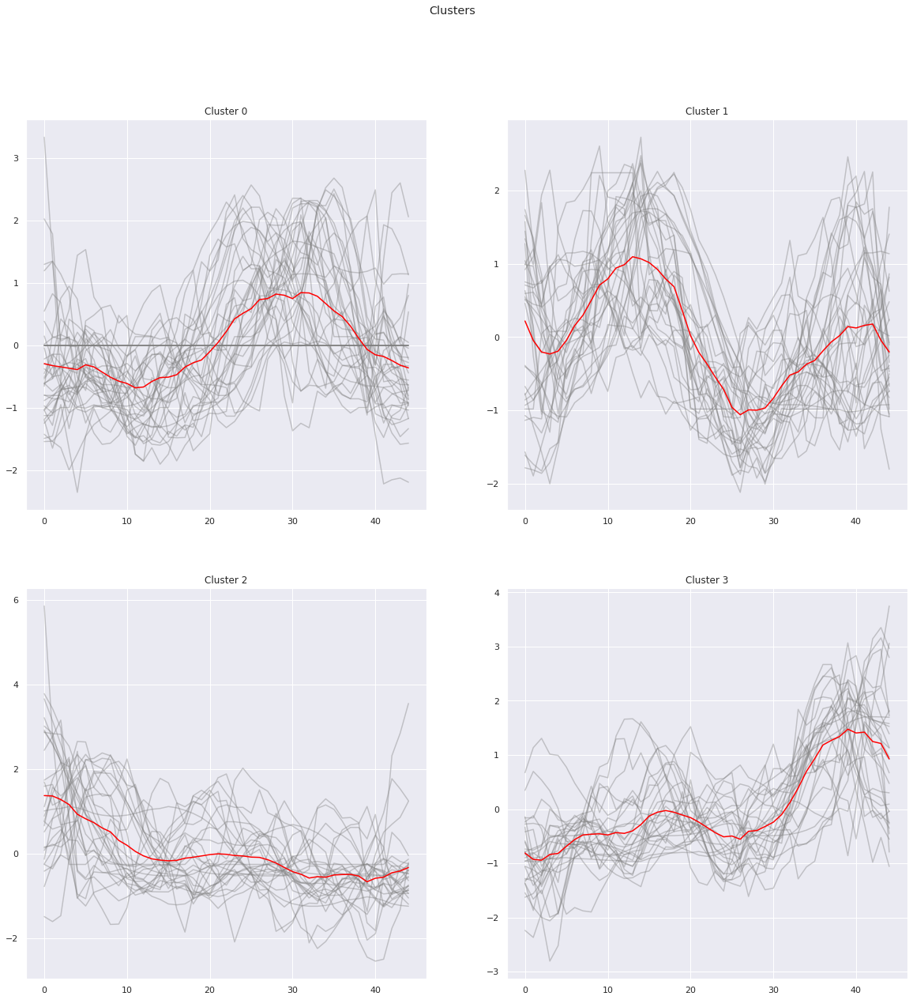

In [1109]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_test_de[i],c="gray",alpha=0.4)
                cluster.append(series_test_de[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

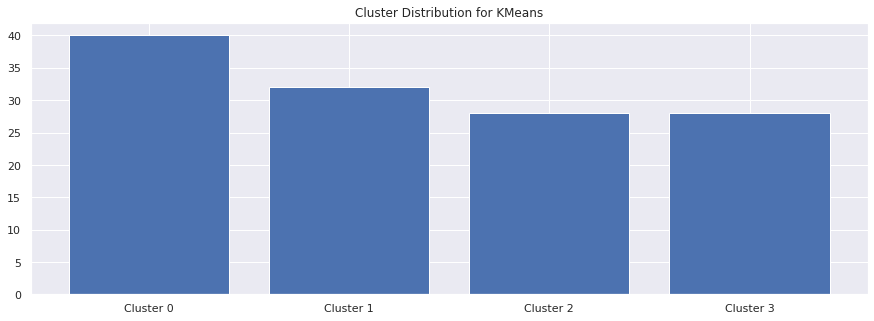

In [1110]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [1111]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [1112]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [1113]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

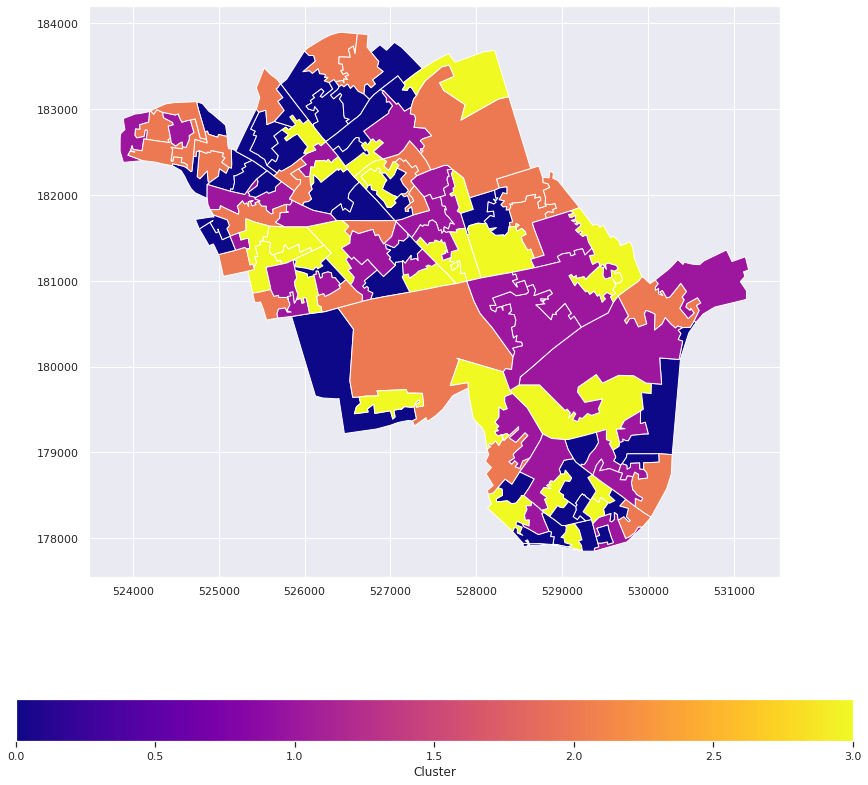

In [1114]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.1.6 LSOA & Year_Month_Smooth_reduce_seasonality_Street

In [1116]:
# 接着要进一步除去 seasonality, 只聚类时间

In [1117]:
noise_test_true['Category_by'] = noise_test_true['Year_Month'] 


In [1118]:
# select only residential 

noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Street']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Commercial Premises']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Residential Premises']
#noise_test_true_summary_lsoa_time = noise_test_true.copy().loc[noise_test_true.Service_Request_Group_Sub_Type == 'Property Alarm']

noise_test_true_summary_lsoa_time = noise_test_true_summary_lsoa_time.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time 

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04,Westminster 001A,2018-04,1
2018-05,Westminster 001A,2018-05,1
2018-07,Westminster 001A,2018-07,4
2018-08,Westminster 001A,2018-08,2
2018-09,Westminster 001A,2018-09,1
...,...,...,...
2021-07,Westminster 024F,2021-07,2
2021-10,Westminster 024F,2021-10,1
2021-11,Westminster 024F,2021-11,2


In [1119]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

#noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
#noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
#noise_test_true_summary_lsoa_time 

In [1120]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [1121]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{2, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50}


In [1122]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [1123]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [1124]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [1125]:
series[1].head()

,LSOA_2011_Name,Noise_Complaint_Index,smoth_6
Category_by,,,
2018-09,Westminster 001B,1.0,1.000000
2018-10,Westminster 001B,1.5,1.083333
2018-11,Westminster 001B,2.0,1.250000
2018-12,Westminster 001B,2.0,1.416667
2019-01,Westminster 001B,2.0,1.583333


In [1126]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']
series_test[1].head()

,smoth_6
Category_by,
2018-09,1.000000
2018-10,1.083333
2018-11,1.250000
2018-12,1.416667
2019-01,1.583333


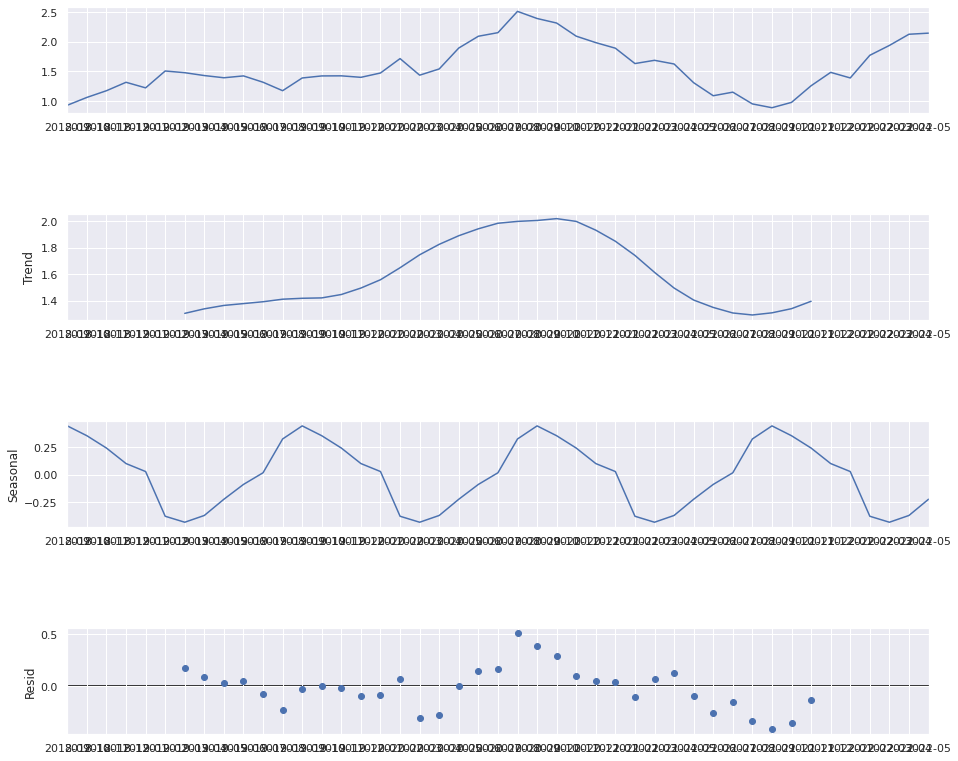

In [1127]:
from statsmodels.tsa.seasonal import seasonal_decompose

#noise_test_summary_date.set_index('Date', inplace=True)

series_test_de = series_test.copy()

list_trend = []
list_seasonal = []
list_residual = []

# Take seasons as freq,
#decompose_result_mult = seasonal_decompose(analysis, model="multiplicative", freq=90)
for i in range(len(series_test_de)):
    decompose_result_mult = seasonal_decompose(series_test_de[i], model="additive", freq= 12)
    trend = decompose_result_mult.trend
    seasonal = decompose_result_mult.seasonal
    residual = decompose_result_mult.resid
    list_trend.append(trend)
    list_seasonal.append(seasonal)
    list_residual.append(residual)
    series_test_de[i]['smoth_6'] = series_test_de[i]['smoth_6'] - seasonal

fig = decompose_result_mult.plot()
fig.set_size_inches((16, 12))

In [1128]:
# min-max transform
for i in range(len(series_test_de)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test_de[i] = StandardScaler().fit_transform(series_test_de[i])
    series_test_de[i] = series_test_de[i].reshape(len(series_test_de[i]))


In [1129]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 25.7 s, sys: 23.1 s, total: 48.8 s
Wall time: 25.6 s


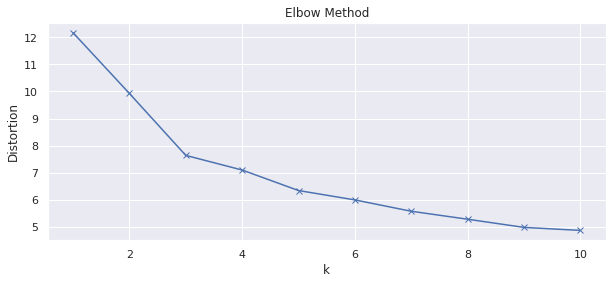

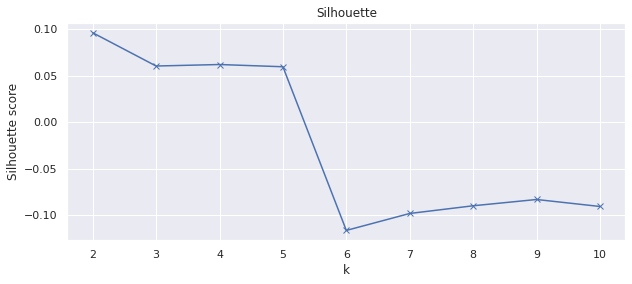

In [1130]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test_de, max_clusters=10, metric='dtw', seed=SEED)

In [1131]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 8.97 s, sys: 1.64 s, total: 10.6 s
Wall time: 2.62 s


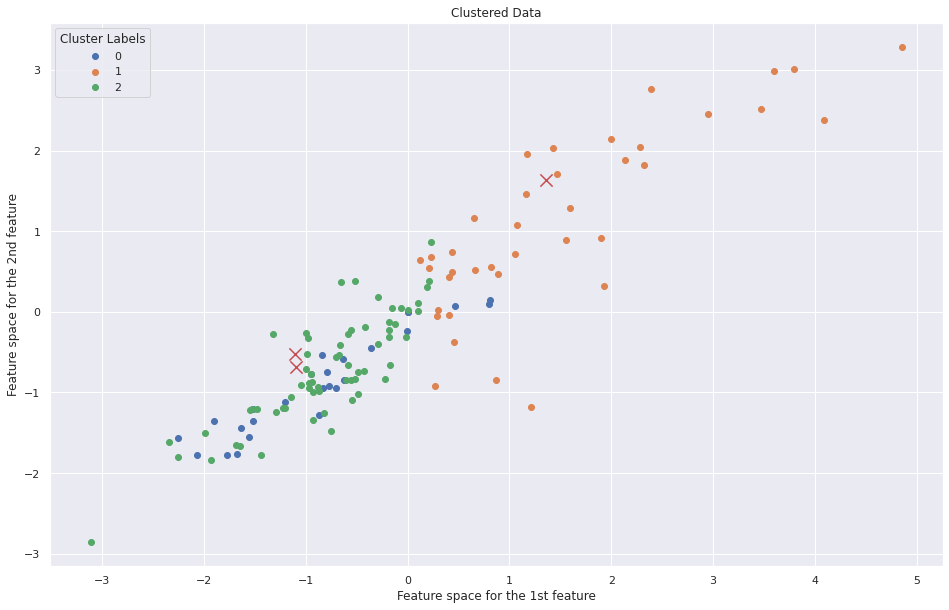

In [1146]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test_de),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

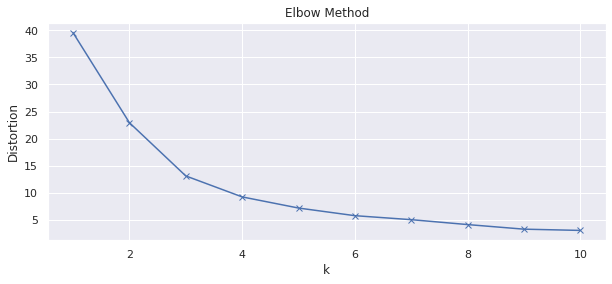

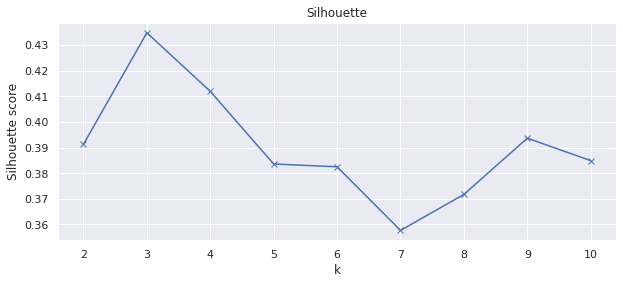

In [1147]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test_de) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [1162]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 3
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

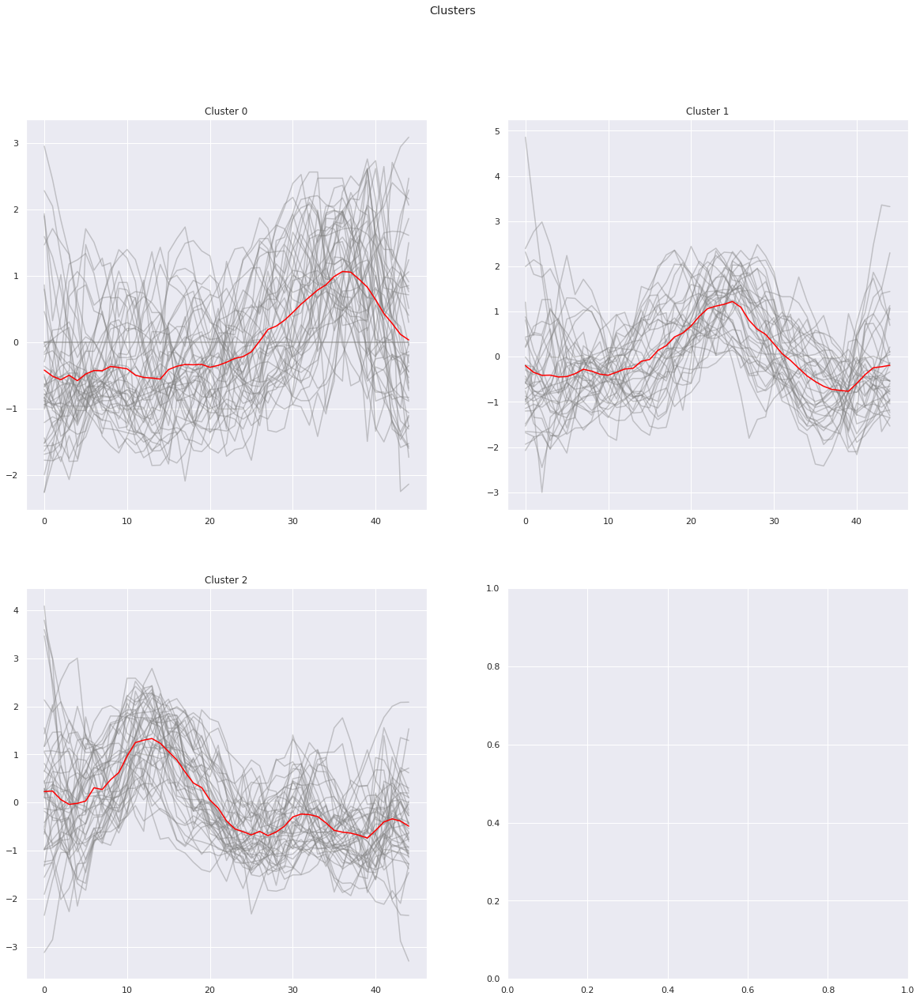

In [1163]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_test_de[i],c="gray",alpha=0.4)
                cluster.append(series_test_de[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

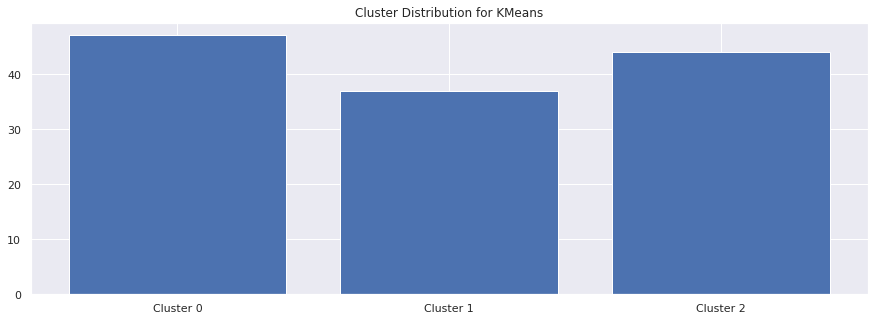

In [1164]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [1165]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [1166]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [1167]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

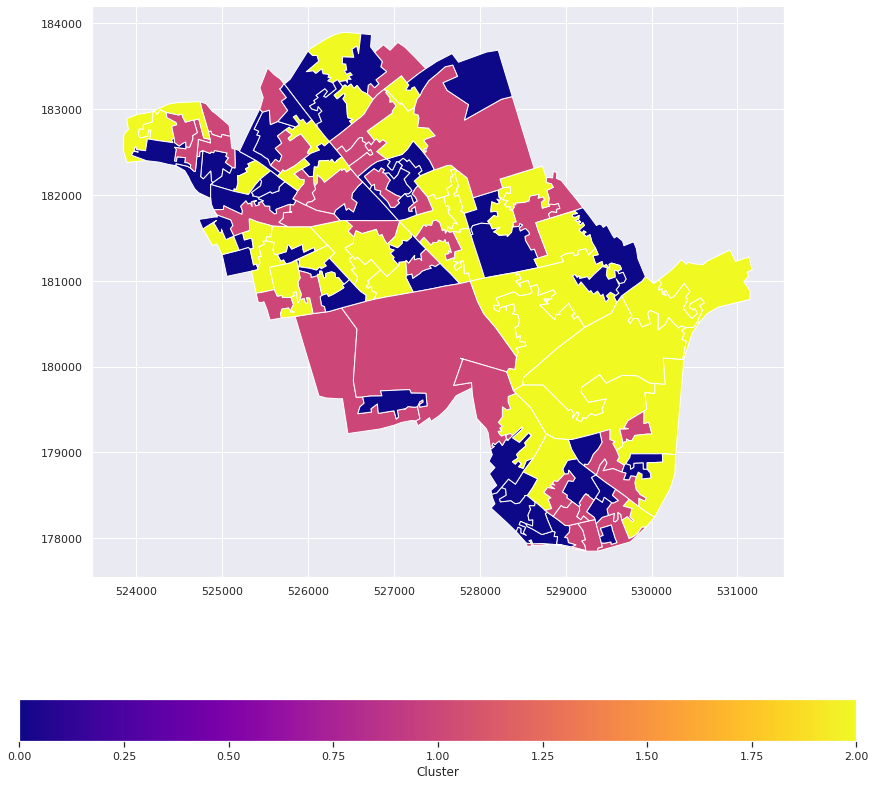

In [1168]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.4 Clustering based on LSOA & Date

## 3.4.1 LSOA & Date_Baseline Model

In [192]:
# Baseline analysis
noise_test_true['Category_by'] = noise_test_true['Date'] 

In [20]:
noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04-17,Westminster 001A,2018-04-17,1
2018-04-19,Westminster 001A,2018-04-19,1
2018-04-20,Westminster 001A,2018-04-20,2
2018-04-25,Westminster 001A,2018-04-25,2
2018-05-07,Westminster 001A,2018-05-07,1
...,...,...,...
2022-05-06,Westminster 024F,2022-05-06,1
2022-05-14,Westminster 024F,2022-05-14,1
2022-05-20,Westminster 024F,2022-05-20,1


In [21]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]
    series.append(df)

In [22]:
print(len(series))

128


In [23]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{512, 514, 1047, 544, 545, 558, 48, 1073, 569, 581, 582, 613, 617, 117, 125, 140, 148, 1175, 664, 669, 160, 163, 169, 172, 175, 176, 178, 1210, 699, 194, 200, 202, 207, 210, 213, 215, 224, 232, 235, 238, 240, 244, 245, 767, 770, 262, 263, 264, 267, 268, 269, 270, 271, 273, 786, 281, 282, 285, 292, 293, 295, 302, 304, 306, 309, 310, 315, 317, 835, 327, 329, 331, 336, 337, 338, 339, 340, 341, 343, 352, 354, 357, 360, 362, 365, 367, 373, 374, 376, 378, 379, 381, 384, 391, 394, 397, 401, 406, 419, 422, 424, 428, 442, 960, 454, 455, 458, 462, 471, 987, 483, 487, 1001, 490, 491, 493, 497, 499, 506}


In [24]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie
longest_serie

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04-01,Westminster 013D,2018-04-01,1
2018-04-02,Westminster 013D,2018-04-02,5
2018-04-03,Westminster 013D,2018-04-03,2
2018-04-04,Westminster 013D,2018-04-04,4
2018-04-05,Westminster 013D,2018-04-05,5
...,...,...,...
2022-05-16,Westminster 013D,2022-05-16,1
2022-05-17,Westminster 013D,2022-05-17,3
2022-05-19,Westminster 013D,2022-05-19,1


In [25]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [26]:
for i in range(len(series)):
    series[i]['Noise_Complaint_Index'] = series[i]['Noise_Complaint_Index'].fillna(0)
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)

In [27]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name'], axis = 1)
series_test[0]

,Noise_Complaint_Index
Category_by,
2018-04-01,0.0
2018-04-02,0.0
2018-04-03,0.0
2018-04-04,0.0
2018-04-05,0.0
...,...
2022-05-16,0.0
2022-05-17,0.0
2022-05-19,0.0


In [28]:
# min-max transform
for i in range(len(series_test)):
    scaler = MinMaxScaler()
    series[i] = MinMaxScaler().fit_transform(series[i])
    series[i] = series[i].reshape(len(series[i]))

In [29]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 6
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(series_test)

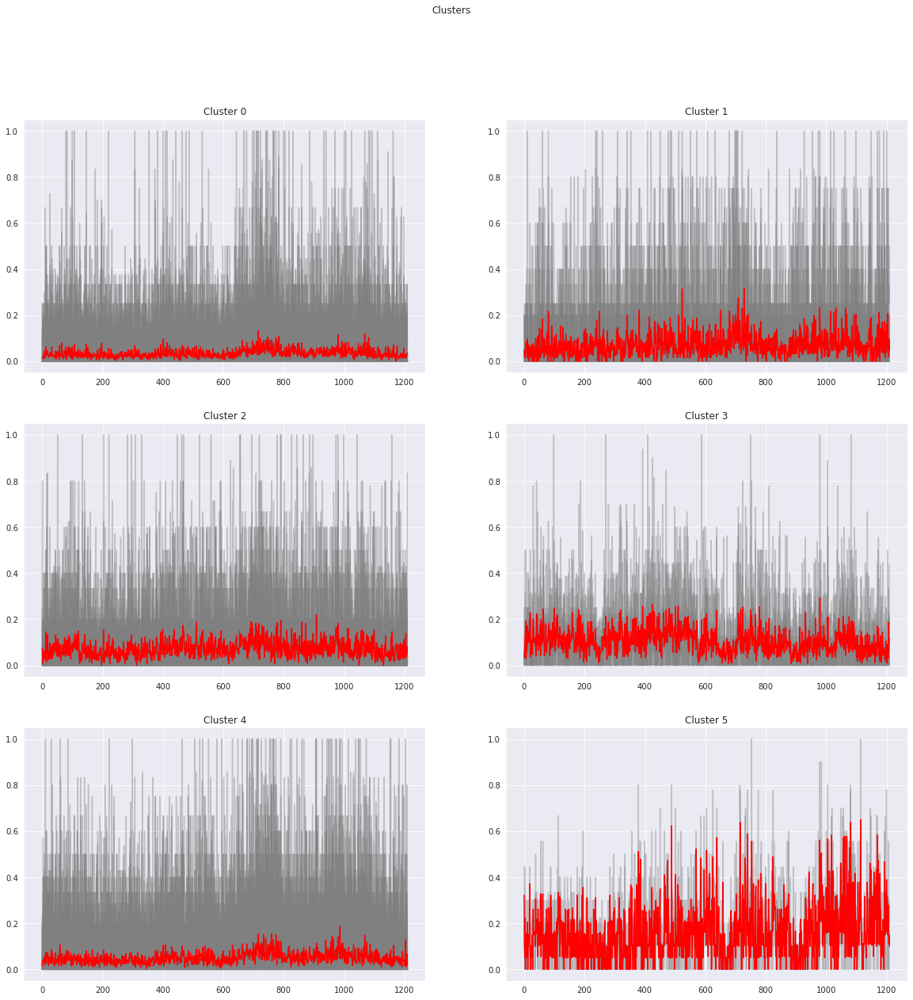

In [30]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(3,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

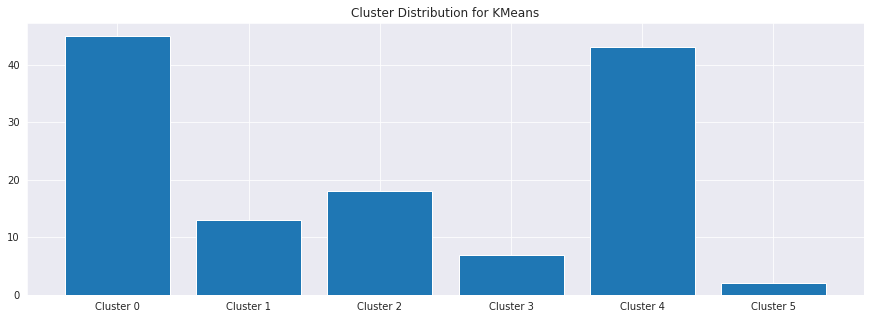

In [31]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [32]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [33]:
label_df

,cluster
0,4
1,0
2,0
3,4
4,4
...,...
123,4
124,0
125,4
126,0


In [34]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [35]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

In [36]:
lsoa_daily_label_gdf

,LSOA11NM,cluster,geometry
0,Westminster 002A,4,"POLYGON ((526614.987 183877.891, 526587.256 18..."
1,Westminster 001A,4,"POLYGON ((527129.958 183718.538, 527260.358 18..."
2,Westminster 002B,0,"POLYGON ((525997.350 183674.612, 526051.000 18..."
3,Westminster 001B,0,"POLYGON ((526773.508 183661.194, 526862.993 18..."
4,Westminster 002C,1,"POLYGON ((526302.269 183161.213, 526338.035 18..."
...,...,...,...
123,Westminster 009J,4,"POLYGON ((526962.196 181855.934, 527006.358 18..."
124,Westminster 009K,0,"POLYGON ((526888.382 182291.621, 526866.264 18..."
125,Westminster 014F,4,"POLYGON ((525237.341 181558.428, 525257.777 18..."
126,Westminster 014G,0,"POLYGON ((525582.183 181638.547, 525565.190 18..."


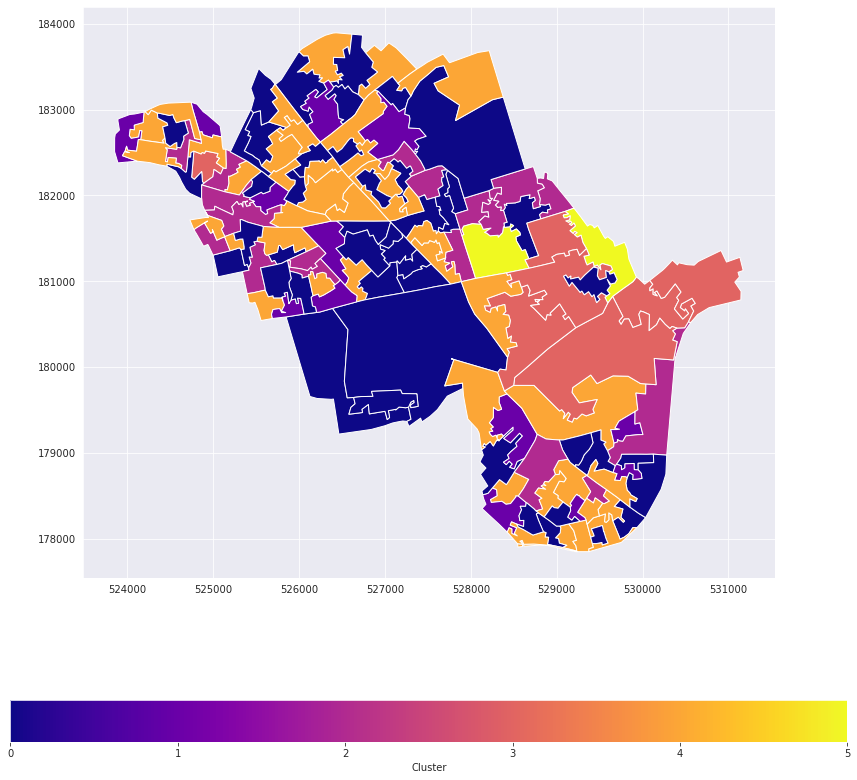

In [37]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.2 Clustering based on LSOA & Weekday

## 3.2.1 LSOA & Weekday_Baseline Model

In [26]:
noise_test_true['Category_by'] = noise_test_true['Weekday']

In [27]:
noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
0,Westminster 001A,0,67
1,Westminster 001A,1,42
2,Westminster 001A,2,57
3,Westminster 001A,3,60
4,Westminster 001A,4,54
...,...,...,...
2,Westminster 024F,2,60
3,Westminster 024F,3,43
4,Westminster 024F,4,44


In [667]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]
    series.append(df)

In [668]:
print(len(series))

128


In [669]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{7}


In [670]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie
longest_serie

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
0,Westminster 024F,0,44
1,Westminster 024F,1,48
2,Westminster 024F,2,60
3,Westminster 024F,3,43
4,Westminster 024F,4,44
5,Westminster 024F,5,74
6,Westminster 024F,6,68


In [671]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [672]:
for i in range(len(series)):
    series[i]['Noise_Complaint_Index'] = series[i]['Noise_Complaint_Index'].fillna(0)
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)

In [673]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name'], axis = 1)
series_test[0]

,Noise_Complaint_Index
Category_by,
0,67
1,42
2,57
3,60
4,54
5,80
6,77


In [674]:
# min-max transform
for i in range(len(series_test)):
    scaler = MinMaxScaler()
    series[i] = MinMaxScaler().fit_transform(series[i])
    series[i] = series[i].reshape(len(series[i]))

In [675]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 6
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(series_test)

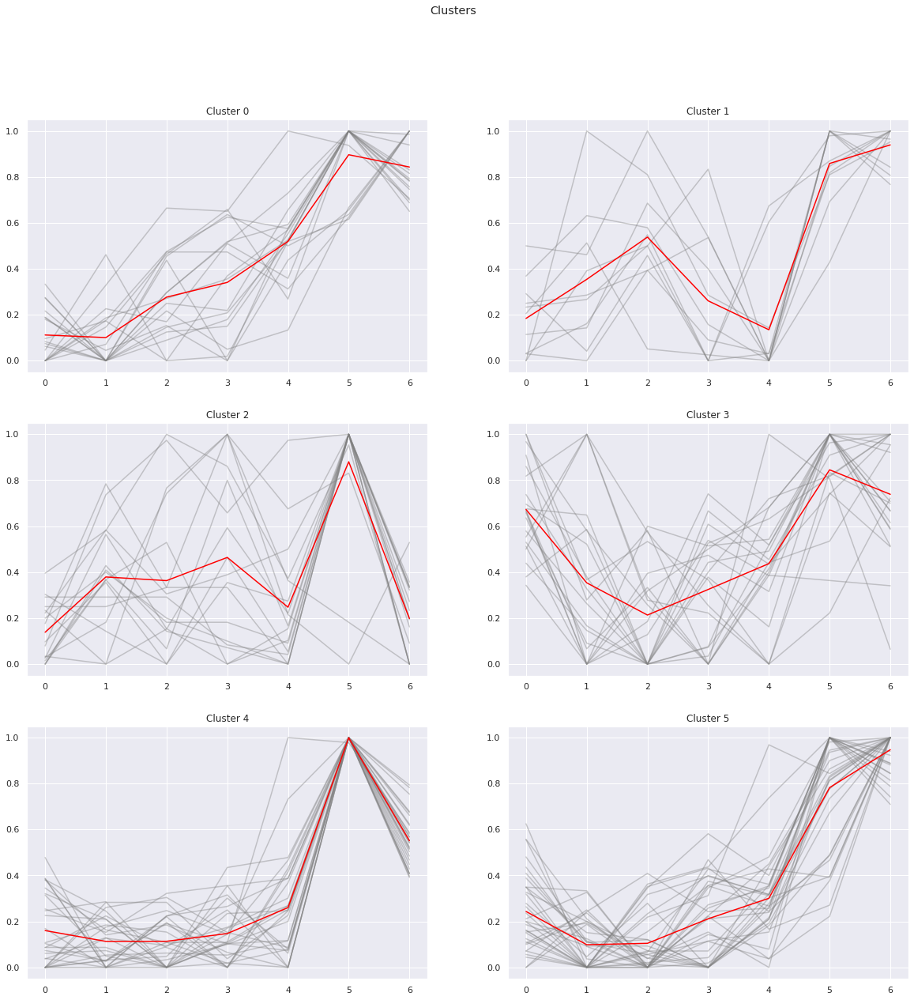

In [676]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(3,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

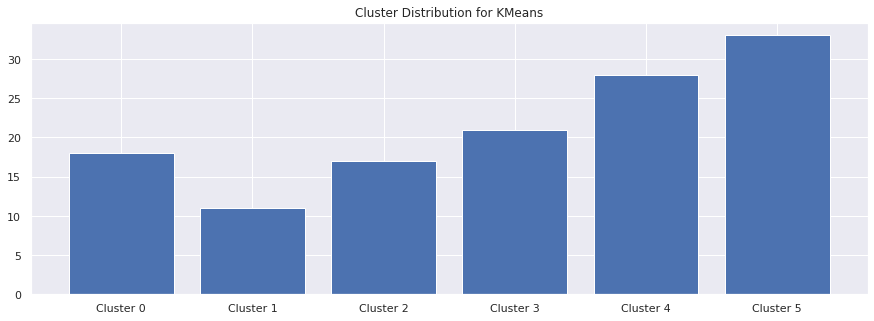

In [677]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [683]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [684]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [685]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

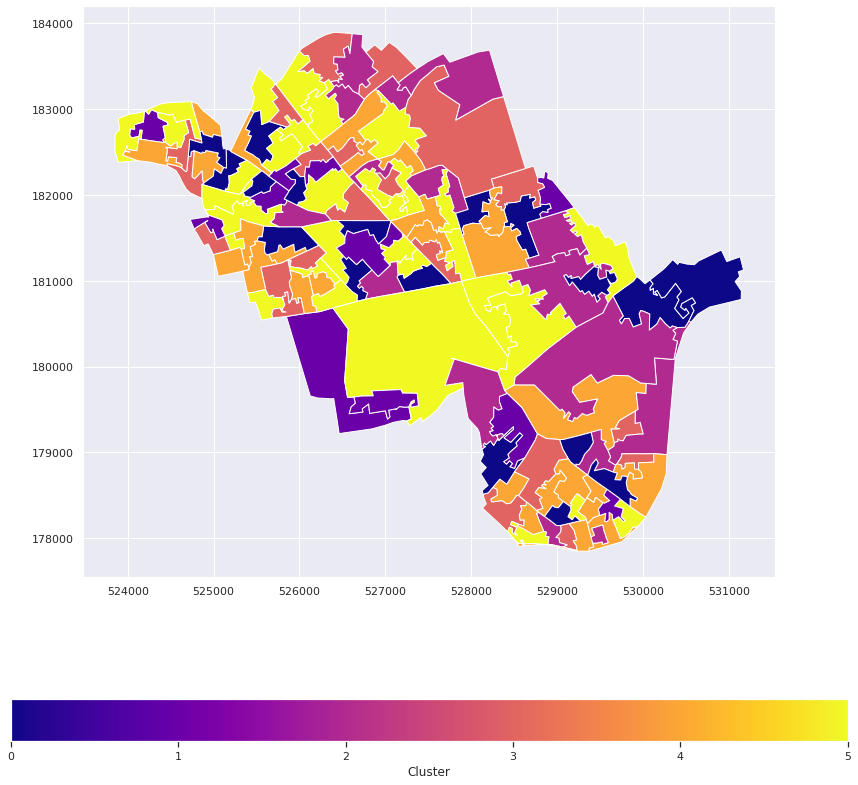

In [687]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.2.2 LSOA & Weekday_Smooth

In [129]:
noise_test_true['Category_by'] = noise_test_true['Weekday'] 

In [130]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
0,Westminster 001A,0,67
1,Westminster 001A,1,42
2,Westminster 001A,2,57
3,Westminster 001A,3,60
4,Westminster 001A,4,54
...,...,...,...
2,Westminster 024F,2,60
3,Westminster 024F,3,43
4,Westminster 024F,4,44


In [131]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [132]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{7}


In [133]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [134]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)


* rooling_mean
* interpolate
* fillna - bfill

In [135]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index']
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [136]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']

In [137]:
# min-max transform
for i in range(len(series_test)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test[i] = StandardScaler().fit_transform(series_test[i])
    series_test[i] = series_test[i].reshape(len(series_test[i]))

In [138]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 20.1 s, sys: 20.1 s, total: 40.2 s
Wall time: 21.2 s


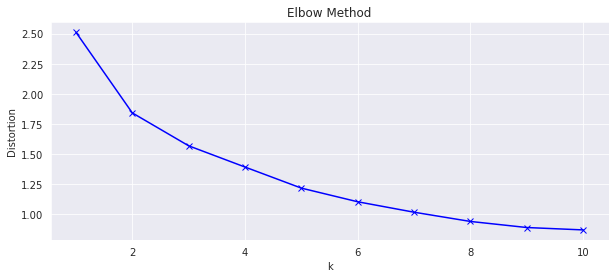

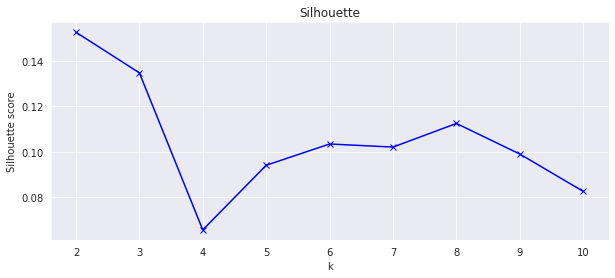

In [139]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test, max_clusters=10, metric='dtw', seed=SEED)

In [140]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 9.93 s, sys: 1.15 s, total: 11.1 s
Wall time: 2.03 s


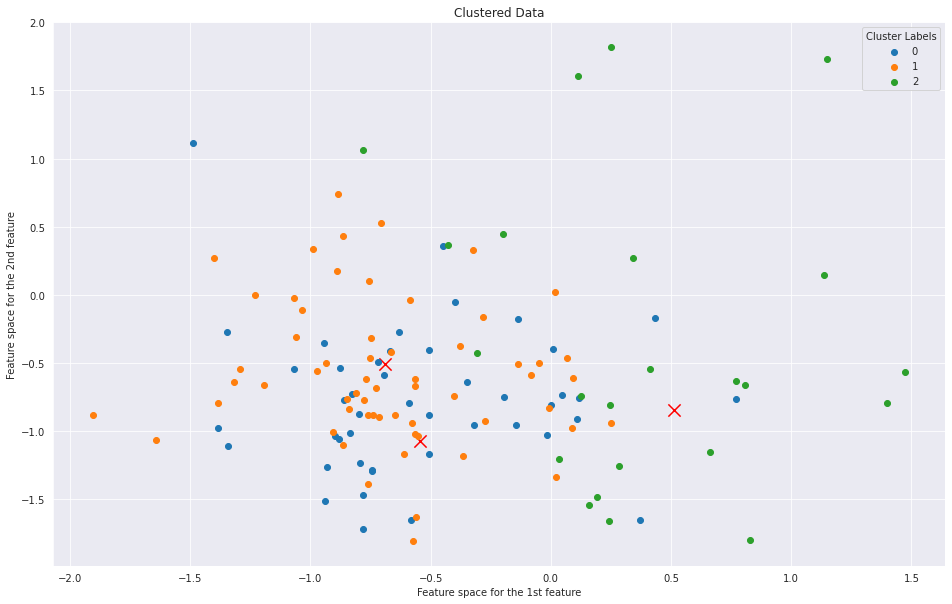

In [141]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

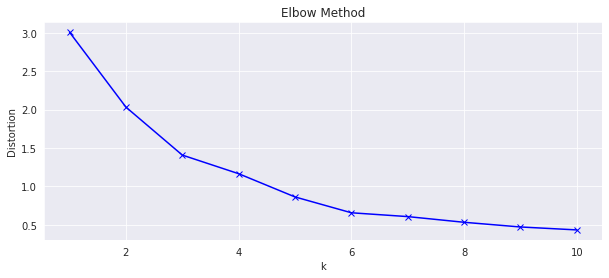

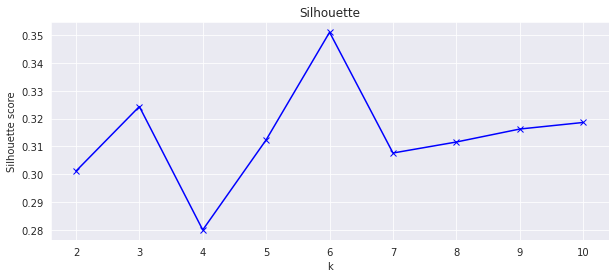

In [142]:
mds = MDS(n_components=2, n_init=4, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [172]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 3
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

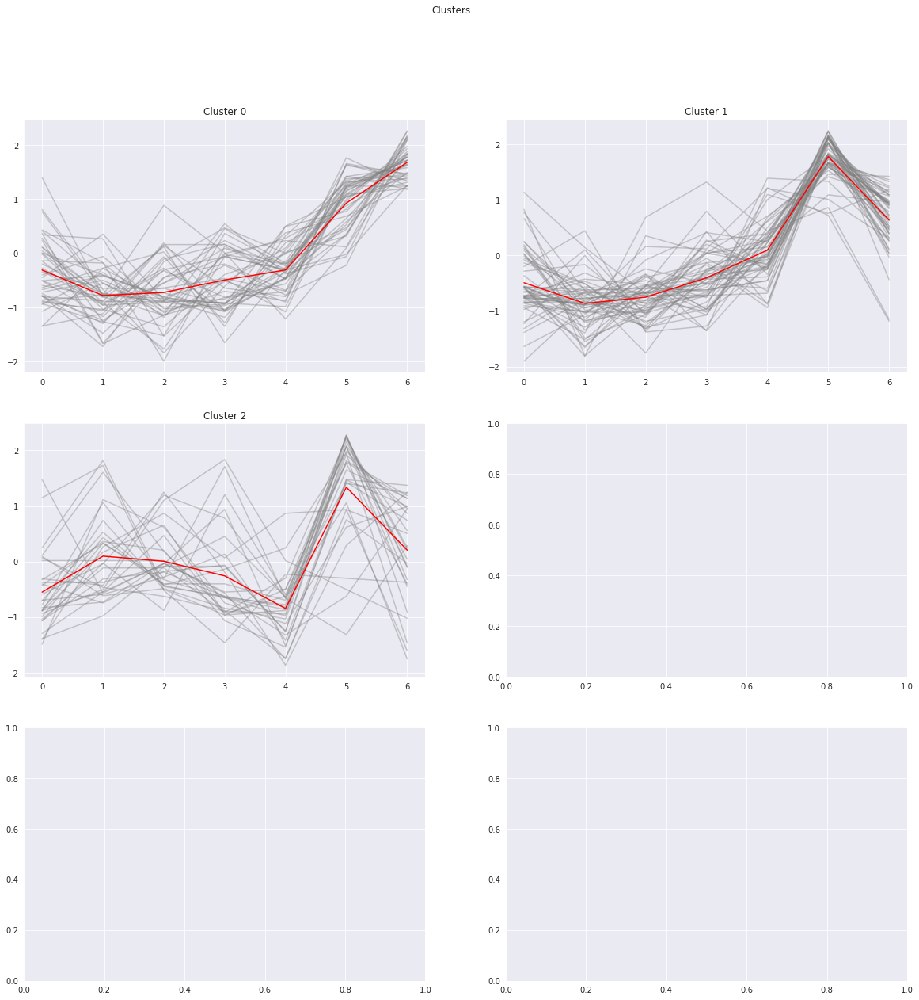

In [173]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(3,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

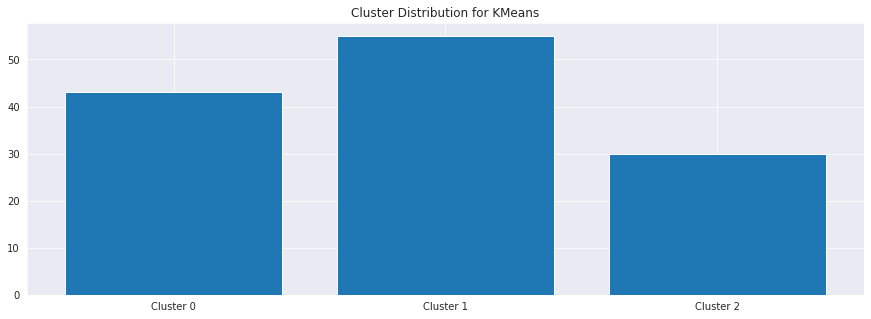

In [174]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [175]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [176]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [177]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

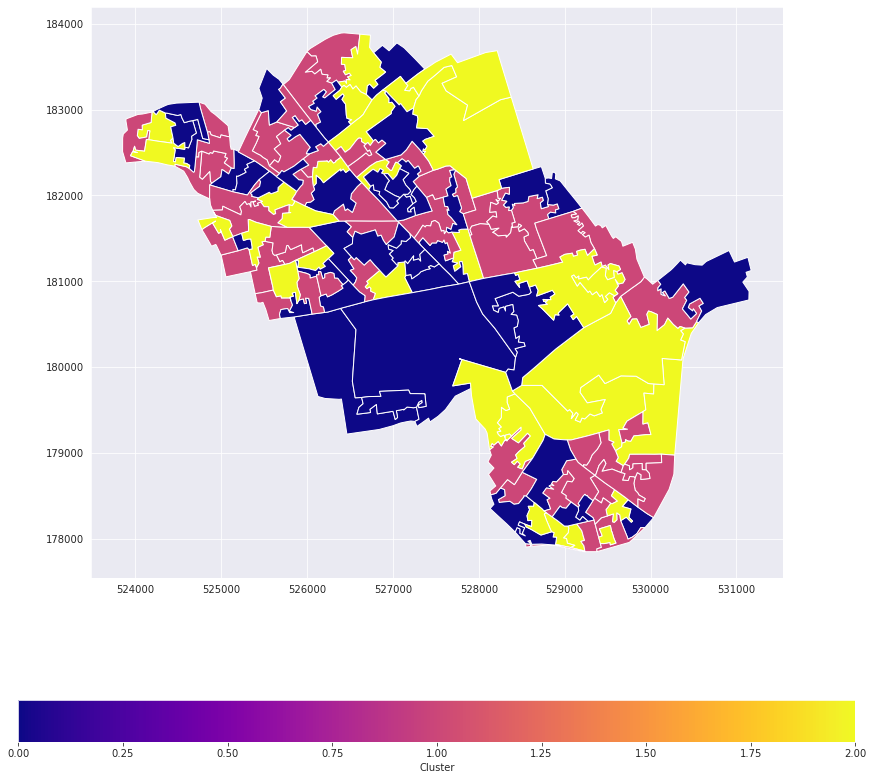

In [178]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.3 Clustering based on LSOA & Time

## 3.3.1 LSOA & Time_Baseline Model

In [723]:
noise_test_true['Category_by'] = noise_test_true['Time'] 

In [724]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
0,Westminster 001A,0,32
1,Westminster 001A,1,20
2,Westminster 001A,2,8
3,Westminster 001A,3,7
4,Westminster 001A,4,7
...,...,...,...
19,Westminster 024F,19,19
20,Westminster 024F,20,17
21,Westminster 024F,21,22


In [725]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]
    series.append(df)

In [726]:
print(len(series))

128


In [727]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{24, 17, 22, 23}


In [728]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie


In [729]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [730]:
for i in range(len(series)):
    series[i]['Noise_Complaint_Index'] = series[i]['Noise_Complaint_Index'].fillna(0)
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)

In [731]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name'], axis = 1)


In [732]:
# min-max transform
for i in range(len(series_test)):
    scaler = MinMaxScaler()
    series[i] = MinMaxScaler().fit_transform(series[i])
    series[i] = series[i].reshape(len(series[i]))

In [737]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 6
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(series_test)

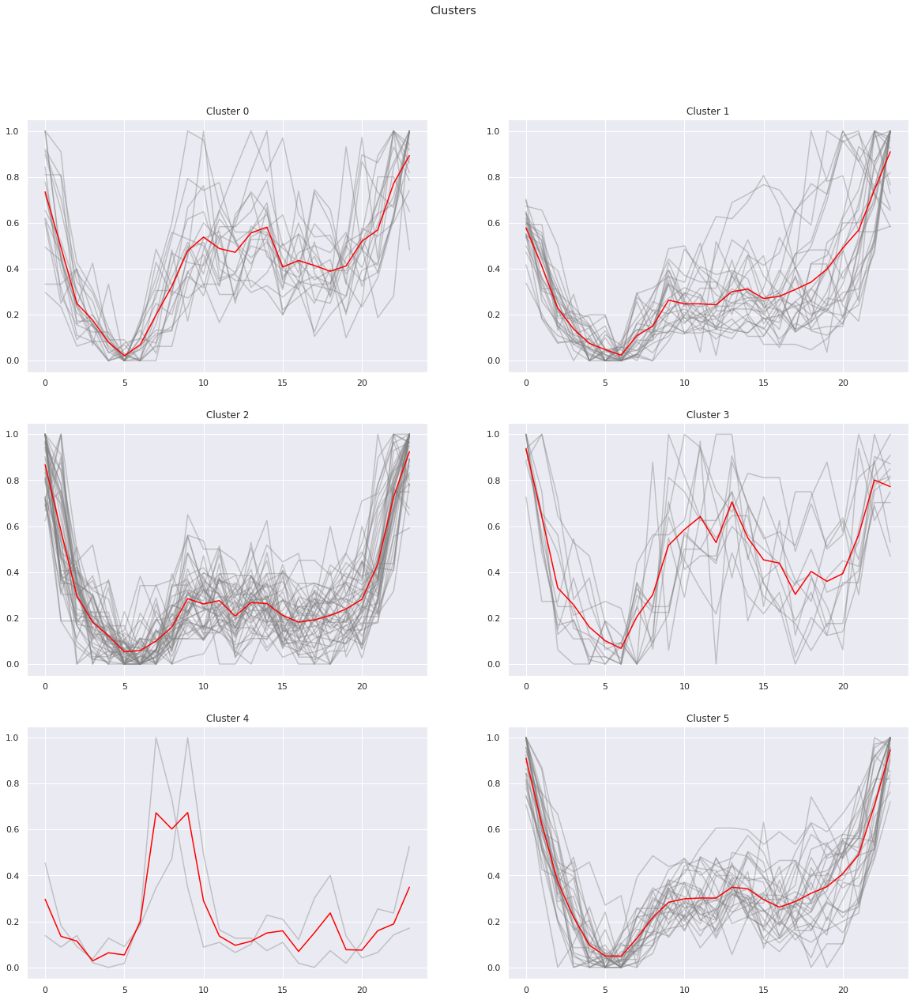

In [738]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(3,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

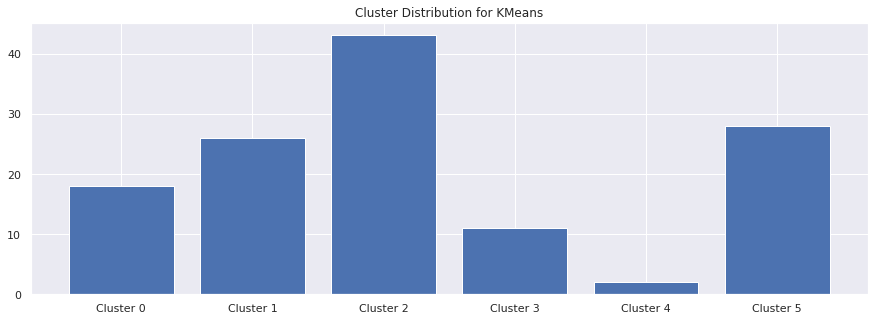

In [739]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [740]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [741]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [742]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

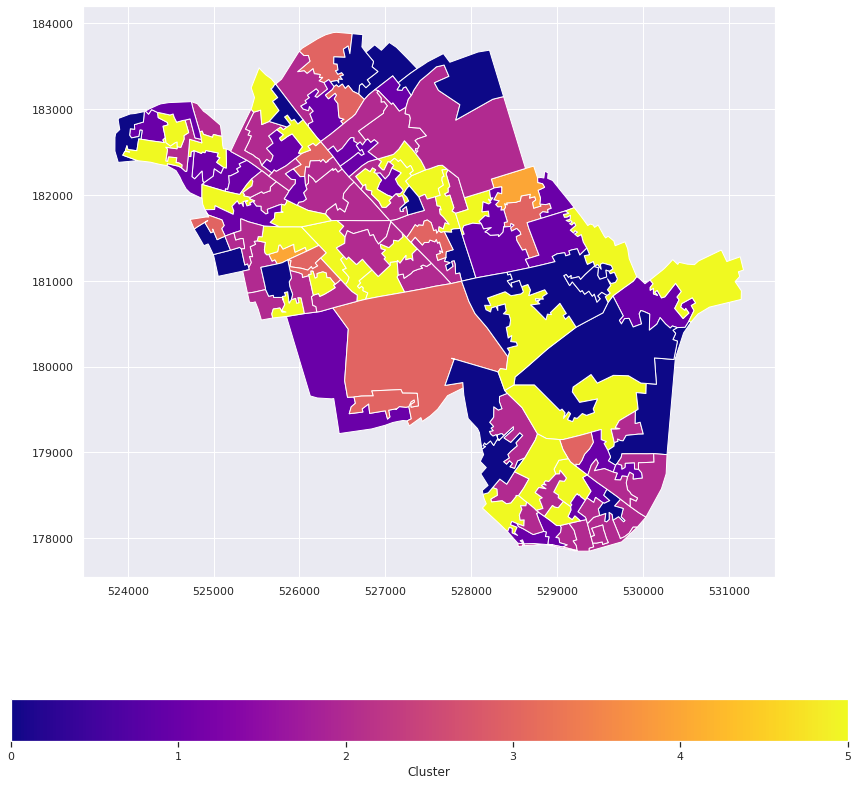

In [744]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.3.2 LSOA & Time_Smooth

In [101]:
noise_test_true['Category_by'] = noise_test_true['Time'] 

In [102]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
0,Westminster 001A,0,32
1,Westminster 001A,1,20
2,Westminster 001A,2,8
3,Westminster 001A,3,7
4,Westminster 001A,4,7
...,...,...,...
19,Westminster 024F,19,19
20,Westminster 024F,20,17
21,Westminster 024F,21,22


In [103]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [104]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{24, 17, 22, 23}


In [105]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [106]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)


* rooling_mean
* interpolate
* fillna - bfill

In [107]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index']
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [108]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']

In [109]:
# min-max transform
for i in range(len(series_test)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test[i] = StandardScaler().fit_transform(series_test[i])
    series_test[i] = series_test[i].reshape(len(series_test[i]))

In [110]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 29.3 s, sys: 27.1 s, total: 56.4 s
Wall time: 30.5 s


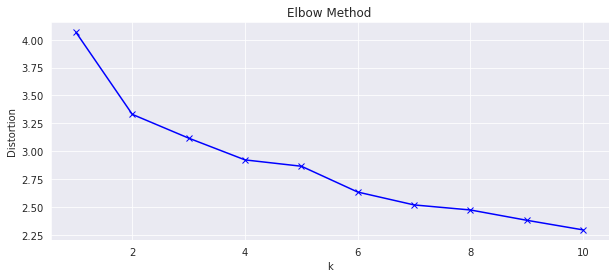

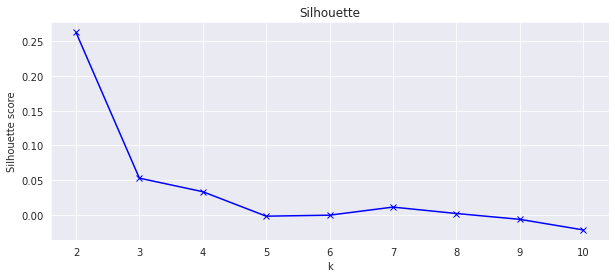

In [111]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test, max_clusters=10, metric='dtw', seed=SEED)

In [112]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 19.5 s, sys: 1.52 s, total: 21.1 s
Wall time: 3.69 s


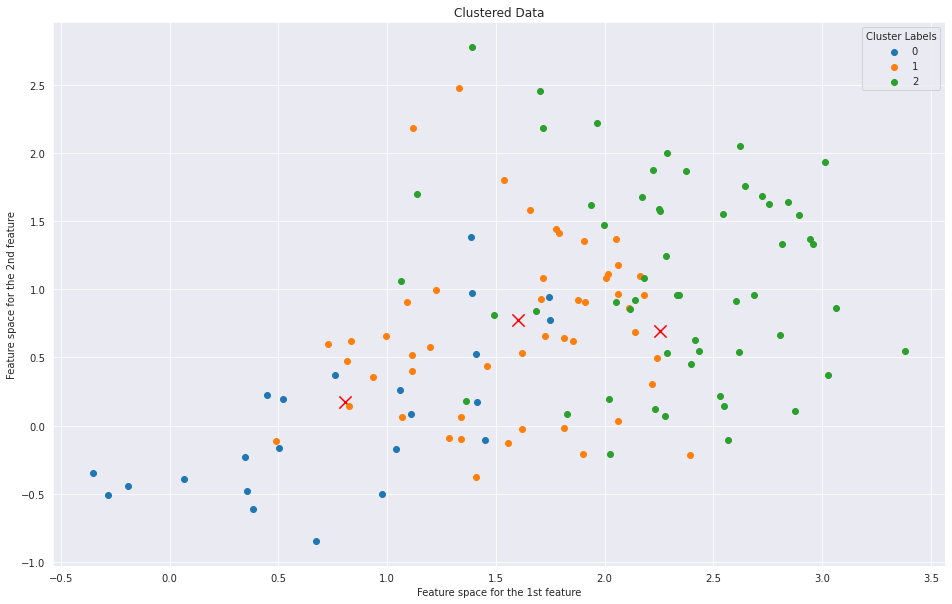

In [113]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

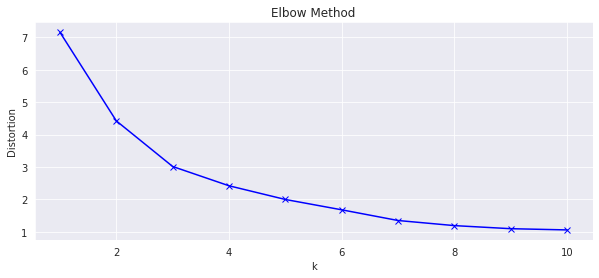

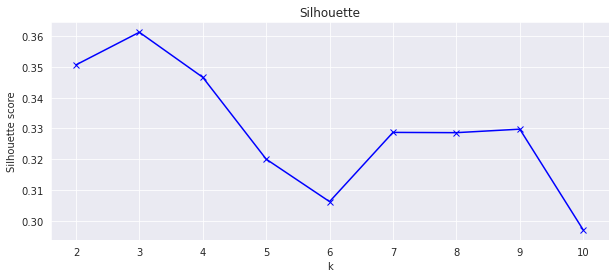

In [114]:
mds = MDS(n_components=2, n_init=4, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [122]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 3
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

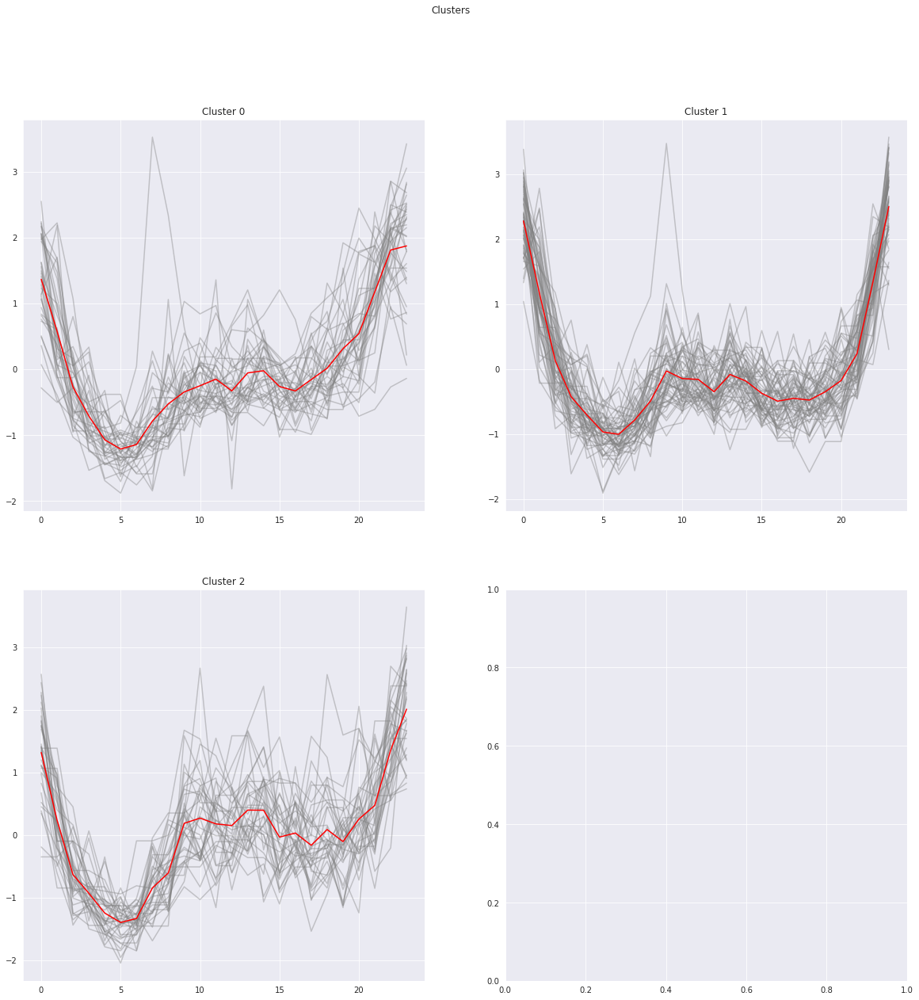

In [123]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

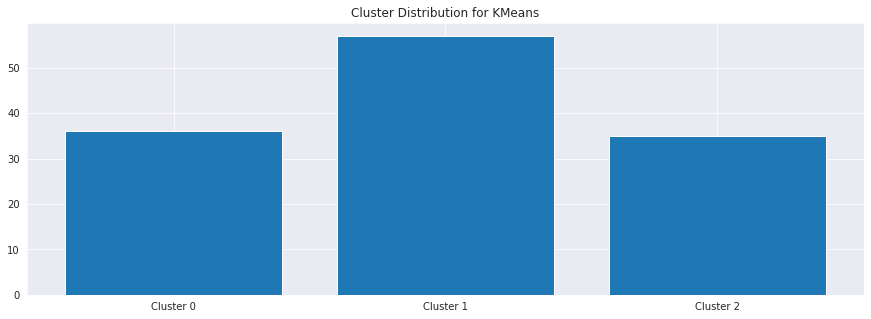

In [124]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [125]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [126]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [127]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

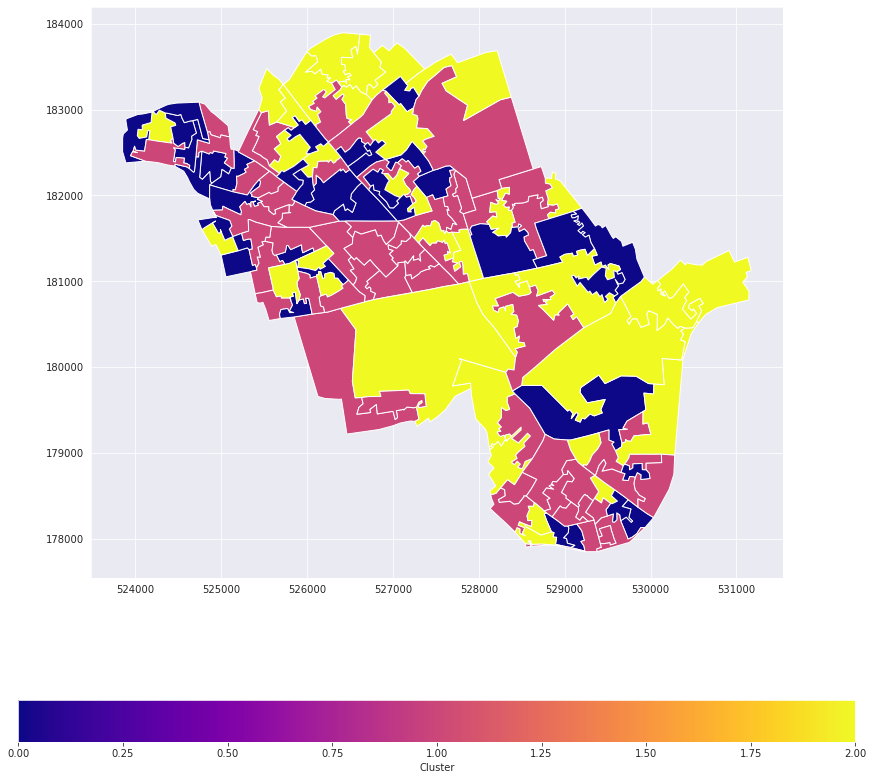

In [128]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.4.2 LSOA & Date_Smooth Model

In [26]:
noise_test_true['Category_by'] = noise_test_true['Date'] 

In [27]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
2018-04-17,Westminster 001A,2018-04-17,1
2018-04-19,Westminster 001A,2018-04-19,1
2018-04-20,Westminster 001A,2018-04-20,2
2018-04-25,Westminster 001A,2018-04-25,2
2018-05-07,Westminster 001A,2018-05-07,1
...,...,...,...
2022-05-06,Westminster 024F,2022-05-06,1
2022-05-14,Westminster 024F,2022-05-14,1
2022-05-20,Westminster 024F,2022-05-20,1


In [40]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [41]:
print(len(series))

128


In [42]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{512, 514, 1047, 544, 545, 558, 48, 1073, 569, 581, 582, 613, 617, 117, 125, 140, 148, 1175, 664, 669, 160, 163, 169, 172, 175, 176, 178, 1210, 699, 194, 200, 202, 207, 210, 213, 215, 224, 232, 235, 238, 240, 244, 245, 767, 770, 262, 263, 264, 267, 268, 269, 270, 271, 273, 786, 281, 282, 285, 292, 293, 295, 302, 304, 306, 309, 310, 315, 317, 835, 327, 329, 331, 336, 337, 338, 339, 340, 341, 343, 352, 354, 357, 360, 362, 365, 367, 373, 374, 376, 378, 379, 381, 384, 391, 394, 397, 401, 406, 419, 422, 424, 428, 442, 960, 454, 455, 458, 462, 471, 987, 483, 487, 1001, 490, 491, 493, 497, 499, 506}


In [43]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [44]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [45]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [46]:
series[1]

,LSOA_2011_Name,Noise_Complaint_Index,smoth_6
Category_by,,,
2018-04-06,Westminster 001B,1.0,1.0
2018-04-07,Westminster 001B,1.0,1.0
2018-04-09,Westminster 001B,1.0,1.0
2018-04-10,Westminster 001B,1.0,1.0
2018-04-11,Westminster 001B,1.0,1.0
...,...,...,...
2022-05-16,Westminster 001B,1.0,1.0
2022-05-17,Westminster 001B,1.0,1.0
2022-05-19,Westminster 001B,1.0,1.0


In [47]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']
series_test[1]

,smoth_6
Category_by,
2018-04-06,1.0
2018-04-07,1.0
2018-04-09,1.0
2018-04-10,1.0
2018-04-11,1.0
...,...
2022-05-16,1.0
2022-05-17,1.0
2022-05-19,1.0


In [48]:
# min-max transform
for i in range(len(series_test)):
    scaler = MinMaxScaler()
    series_test[i] = MinMaxScaler().fit_transform(series_test[i])
    series_test[i] = series_test[i].reshape(len(series_test[i]))

In [49]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 6
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(series_test)

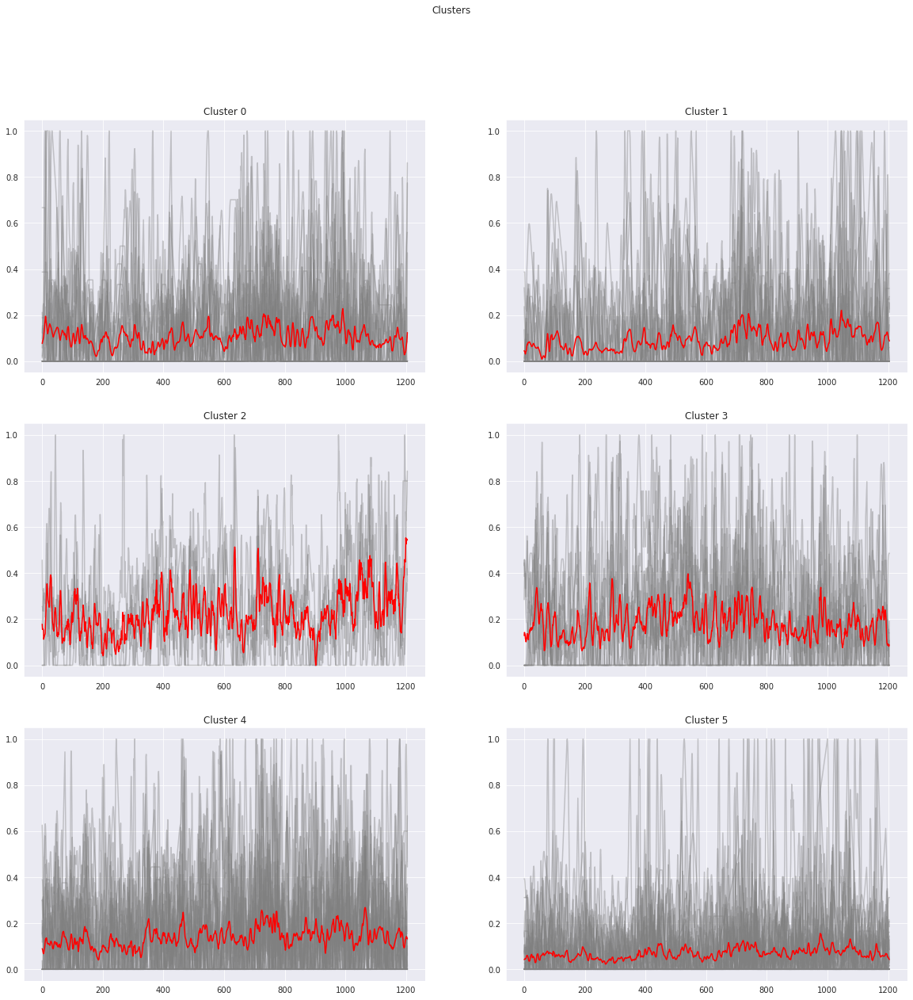

In [50]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(3,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

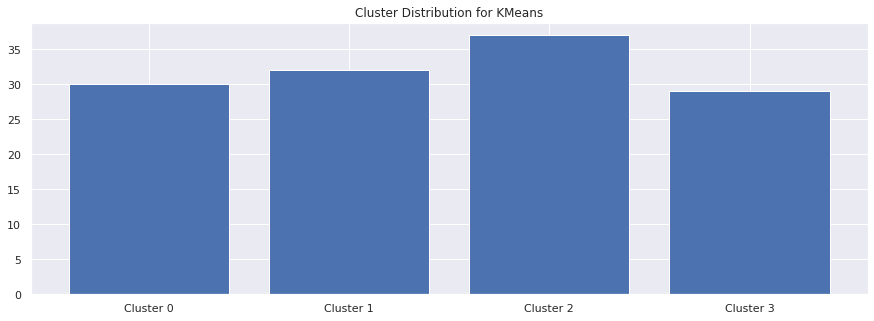

In [871]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [872]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [873]:
label_df

,cluster
0,2
1,1
2,1
3,2
4,0
...,...
123,3
124,0
125,1
126,0


In [874]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [875]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

In [876]:
lsoa_daily_label_gdf

,LSOA11NM,cluster,geometry
0,Westminster 002A,0,"POLYGON ((526614.987 183877.891, 526587.256 18..."
1,Westminster 001A,2,"POLYGON ((527129.958 183718.538, 527260.358 18..."
2,Westminster 002B,2,"POLYGON ((525997.350 183674.612, 526051.000 18..."
3,Westminster 001B,1,"POLYGON ((526773.508 183661.194, 526862.993 18..."
4,Westminster 002C,0,"POLYGON ((526302.269 183161.213, 526338.035 18..."
...,...,...,...
123,Westminster 009J,2,"POLYGON ((526962.196 181855.934, 527006.358 18..."
124,Westminster 009K,3,"POLYGON ((526888.382 182291.621, 526866.264 18..."
125,Westminster 014F,1,"POLYGON ((525237.341 181558.428, 525257.777 18..."
126,Westminster 014G,0,"POLYGON ((525582.183 181638.547, 525565.190 18..."


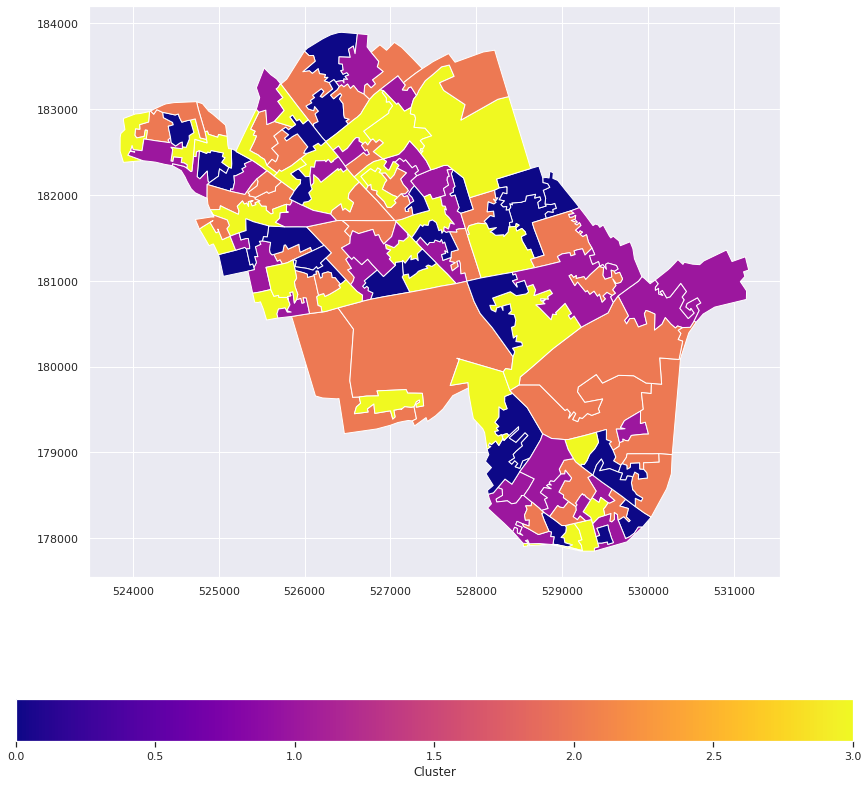

In [877]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 3.5 Clustering based on LSOA & Month

## 3.5.1 LSOA & Month_baseline

In [39]:
noise_test_true['Category_by'] = noise_test_true['Month'] 

In [40]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.
noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
1,Westminster 001A,1,33
2,Westminster 001A,2,37
3,Westminster 001A,3,30
4,Westminster 001A,4,34
5,Westminster 001A,5,42
...,...,...,...
8,Westminster 024F,8,44
9,Westminster 024F,9,21
10,Westminster 024F,10,20


In [41]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]
    series.append(df)

In [42]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{12}


In [43]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie


In [44]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)

In [45]:
for i in range(len(series)):
    series[i]['Noise_Complaint_Index'] = series[i]['Noise_Complaint_Index'].fillna(0)
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)

In [50]:
series_test = series.copy()
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name'], axis = 1)


In [52]:
# min-max transform
for i in range(len(series_test)):
    scaler = MinMaxScaler()
    series_test [i] = MinMaxScaler().fit_transform(series_test[i])
    series_test [i] = series_test[i].reshape(len(series_test[i]))

In [53]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

In [54]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

  0%|          | 0/10 [00:00<?, ?it/s]

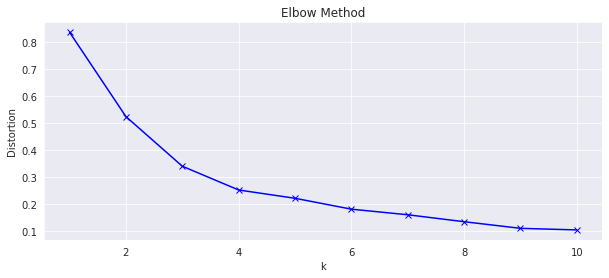

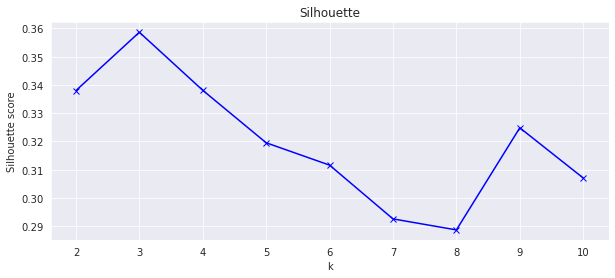

In [66]:
mds = MDS(n_components=2, n_init=4,max_iter=300, random_state=SEED)
data_mds = mds.fit_transform(series_test) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

CPU times: user 10.6 s, sys: 1.5 s, total: 12.1 s
Wall time: 2.06 s


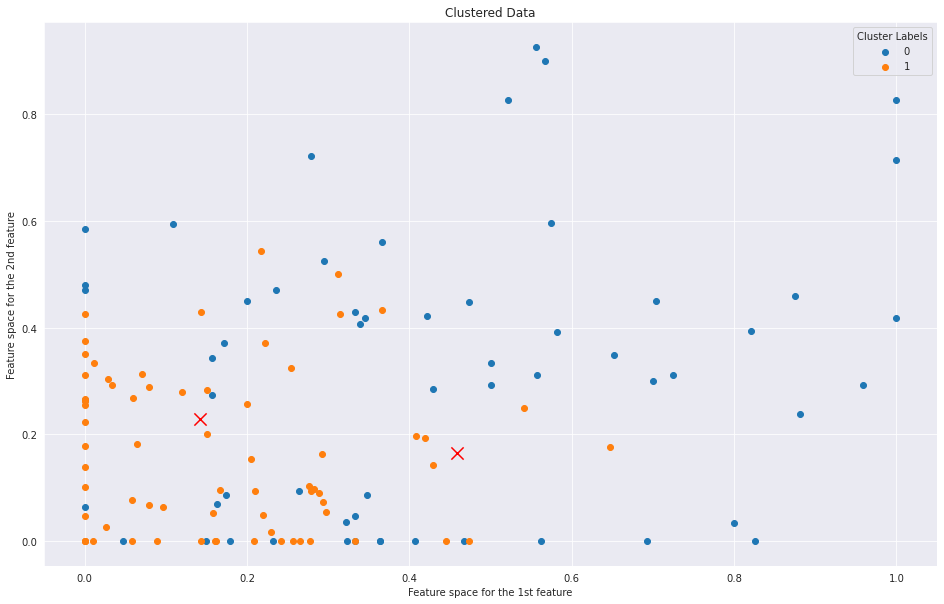

In [67]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

In [71]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 3
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED)

labels = km.fit_predict(data_mds)

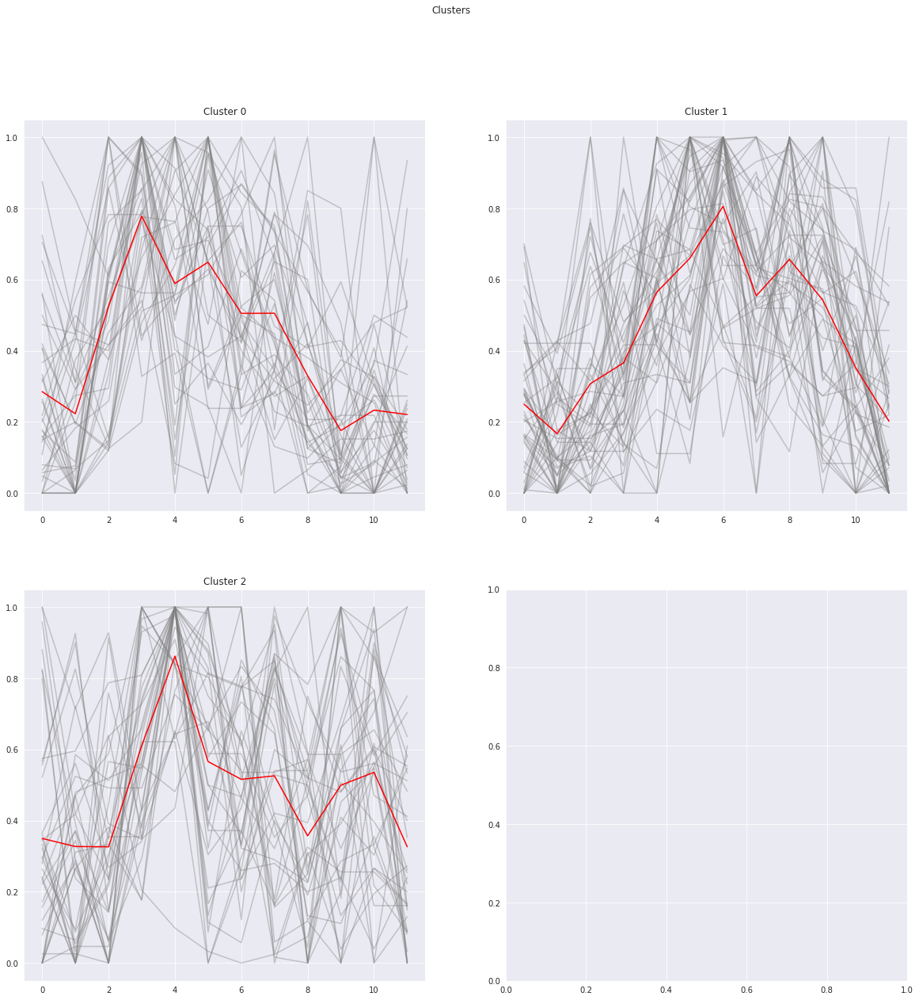

In [72]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_test[i],c="gray",alpha=0.4)
                cluster.append(series_test[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

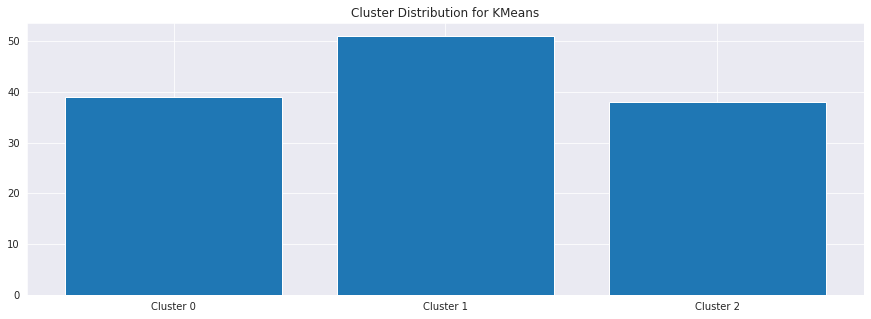

In [73]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [74]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [75]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [76]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11CD','LSOA11NM','cluster','geometry']]

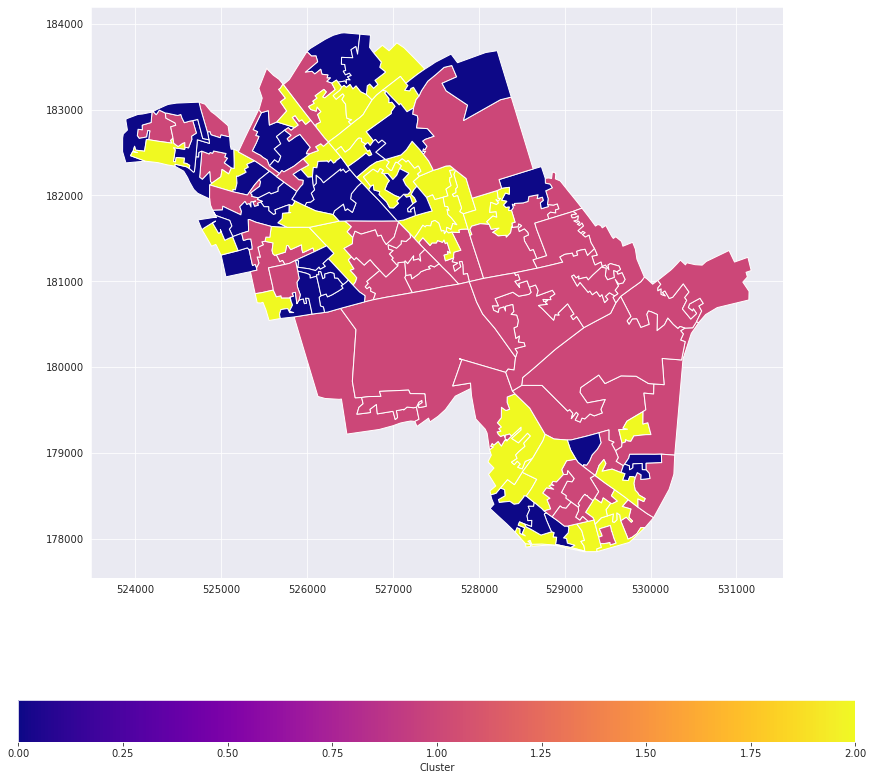

In [77]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

In [78]:
lsoa_daily_label_gdf

,LSOA11CD,LSOA11NM,cluster,geometry
0,E01004646,Westminster 002A,0,"POLYGON ((526614.987 183877.891, 526587.256 18..."
1,E01004647,Westminster 001A,2,"POLYGON ((527129.958 183718.538, 527260.358 18..."
2,E01004648,Westminster 002B,1,"POLYGON ((525997.350 183674.612, 526051.000 18..."
3,E01004649,Westminster 001B,0,"POLYGON ((526773.508 183661.194, 526862.993 18..."
4,E01004650,Westminster 002C,2,"POLYGON ((526302.269 183161.213, 526338.035 18..."
...,...,...,...,...
123,E01033604,Westminster 009J,0,"POLYGON ((526962.196 181855.934, 527006.358 18..."
124,E01033605,Westminster 009K,2,"POLYGON ((526888.382 182291.621, 526866.264 18..."
125,E01033606,Westminster 014F,0,"POLYGON ((525237.341 181558.428, 525257.777 18..."
126,E01033607,Westminster 014G,1,"POLYGON ((525582.183 181638.547, 525565.190 18..."


In [79]:
lsoa_daily_label_gdf.cluster = lsoa_daily_label_gdf.cluster.astype('string')
lsoa_daily_label_gdf.head()

lsoa_daily_label_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 128 entries, 0 to 127
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LSOA11CD  128 non-null    object  
 1   LSOA11NM  128 non-null    object  
 2   cluster   128 non-null    string  
 3   geometry  128 non-null    geometry
dtypes: geometry(1), object(2), string(1)
memory usage: 5.0+ KB


## 3.5.2 LSOA & Month_Smooth

In [80]:
noise_test_true['Category_by'] = noise_test_true['Month'] 

In [81]:
# 以24小时和lsoa进行分类汇总

# Summarize the complaints with lsoa, only 161 records, meaning that one lsoa has no records.

noise_test_true_summary_lsoa_time = noise_test_true.groupby(['LSOA_2011_Name','Category_by']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_summary_lsoa_time  = noise_test_true_summary_lsoa_time.set_index(noise_test_true_summary_lsoa_time['Category_by'])
noise_test_true_summary_lsoa_time

,LSOA_2011_Name,Category_by,Noise_Complaint_Index
Category_by,,,
1,Westminster 001A,1,33
2,Westminster 001A,2,37
3,Westminster 001A,3,30
4,Westminster 001A,4,34
5,Westminster 001A,5,42
...,...,...,...
8,Westminster 024F,8,44
9,Westminster 024F,9,21
10,Westminster 024F,10,20


In [82]:
series = []
LSOA_name = noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()
for i in LSOA_name:
    df = noise_test_true_summary_lsoa_time.loc[noise_test_true_summary_lsoa_time.LSOA_2011_Name == i]

    series.append(df)

In [83]:
series_lengths = {len(serie) for serie in series}
print(series_lengths)


{12}


In [84]:
# Here find the longest series, the residential noise, with zero

max_len = max(series_lengths)
longest_series = None
for serie in series:
    if len(serie) == max_len:
        longest_serie = serie

In [85]:
problems_index = []

for i in range(len(series)):
    if len(series[i])!= max_len:
        problems_index.append(i)
        series[i] = series[i].reindex(longest_serie.index)


* rooling_mean
* interpolate
* fillna - bfill

In [86]:
for i in range(len(series)):
    # Use interpolation to fill values between dates
    series[i]['Noise_Complaint_Index'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Some stores probably were closed on 01-01-YYYYY, fill it by the value on the next day
    series[i]['Noise_Complaint_Index'].fillna(method ='bfill', inplace=True)
    series[i]['smoth_6'] = series[i]['Noise_Complaint_Index']
    #series[i]['smoth_6'] = series[i]['Noise_Complaint_Index'].rolling(6).mean()
    series[i]['LSOA_2011_Name'] = series[i]['LSOA_2011_Name'].fillna(LSOA_name[i])
    series[i] = series[i].drop(['Category_by'], axis = 1)
    series[i] = series[i].dropna()

In [87]:
series_test = series
for i in range(len(series_test)):
    series_test[i] = series_test[i].drop(['LSOA_2011_Name','Noise_Complaint_Index'], axis = 1)
    series_test[i]['smoth_6'] = series_test[i]['smoth_6']

In [88]:
# min-max transform
for i in range(len(series_test)):
    #scaler = MinMaxScaler()
    #scaler = StandardScaler()
    series_test[i] = StandardScaler().fit_transform(series_test[i])
    series_test[i] = series_test[i].reshape(len(series_test[i]))

In [89]:
# Run KMeans and plot the results 
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)
    
    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))
        
    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 30.1 s, sys: 26.2 s, total: 56.3 s
Wall time: 30 s


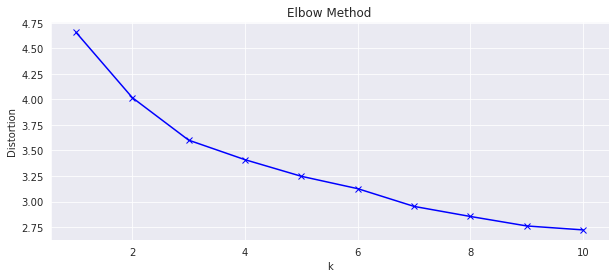

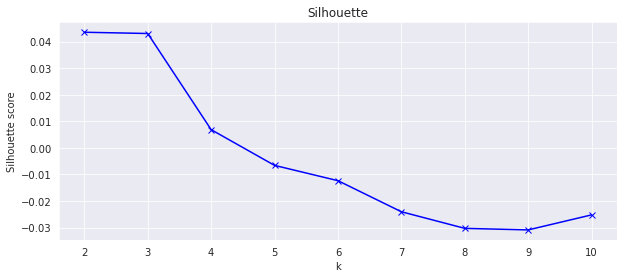

In [90]:
%%time

# Run the algorithm using DTW algorithm 
get_kmeans_results(data=series_test, max_clusters=10, metric='dtw', seed=SEED)

In [91]:
# Visualization for obtained clusters   
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)
    
    # Centroids Visualization
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # Downsize the data into 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 8.03 s, sys: 1.95 s, total: 9.97 s
Wall time: 2.7 s


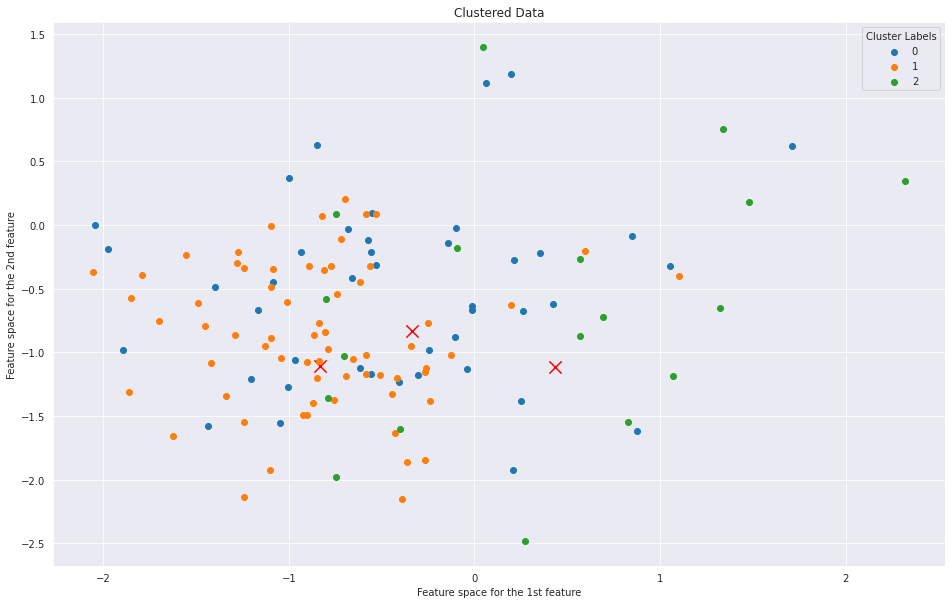

In [92]:
%%time

# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=np.array(series_test),
              cluster_model=model,
              dim_red_algo=TSNE(n_components=3, init='pca', random_state=SEED))

  0%|          | 0/10 [00:00<?, ?it/s]

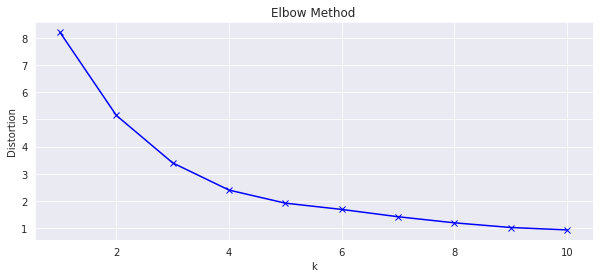

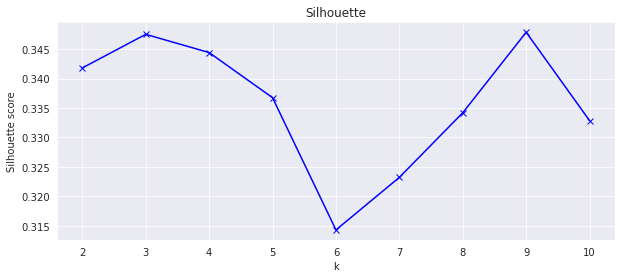

In [93]:
mds = MDS(n_components=2, n_init=4, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(series_test) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='dtw', seed=SEED)

In [94]:
#cluster_count = math.ceil(math.sqrt(len(date_service_series))) 
cluster_count = 3
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",random_state=SEED )

labels = km.fit_predict(data_mds)

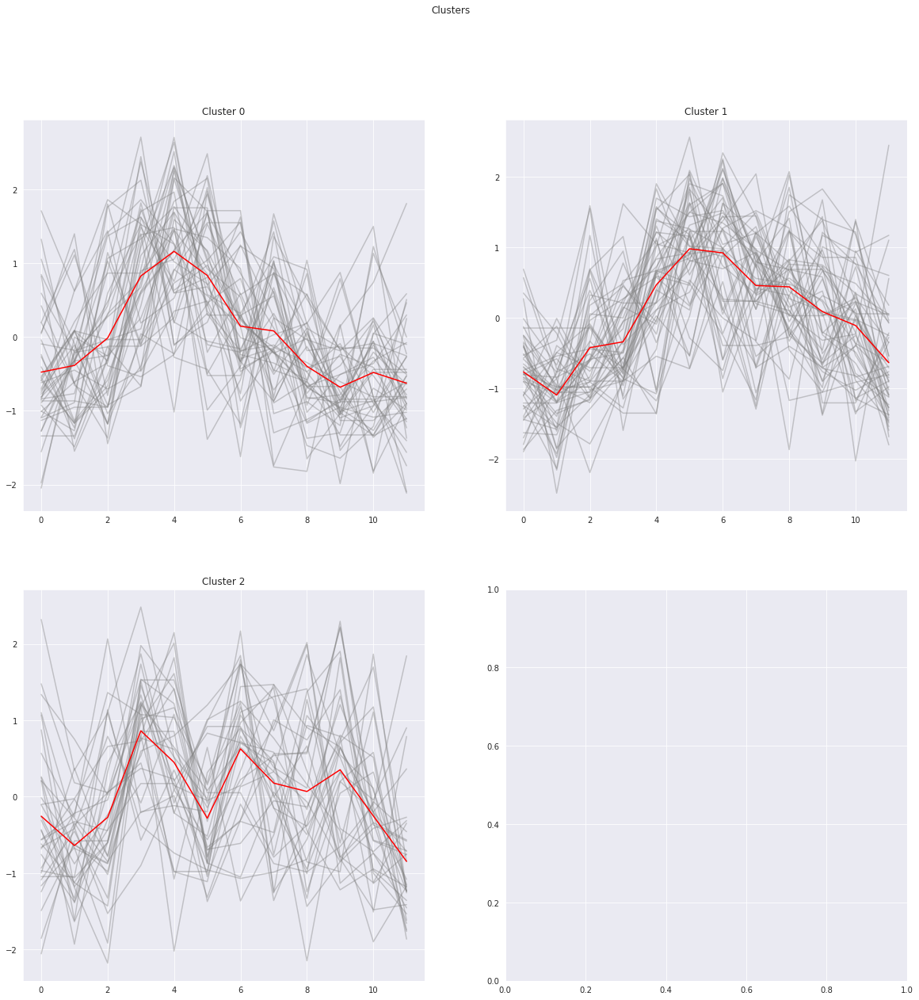

In [95]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(2,2,figsize=(20,20))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_test[i],c="gray",alpha=0.4)
                cluster.append(series_test[i])
                
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        
    axs[row_i, column_j].set_title("Cluster " + str(row_i*2+column_j)) 
    column_j+=1
    if column_j%2 == 0:
        row_i+=1
        column_j=0
        
plt.show()

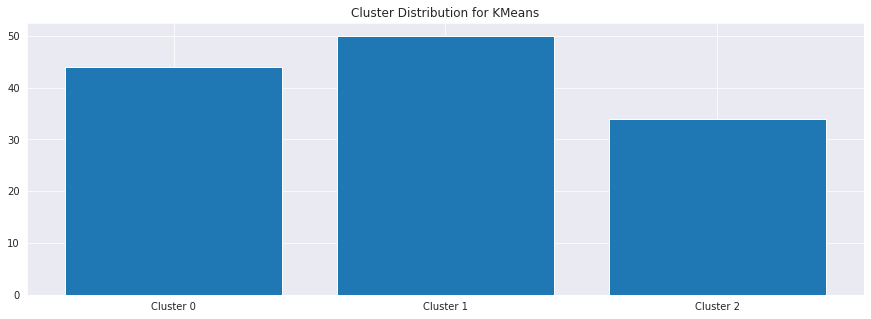

In [96]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [97]:
label_df = pd.DataFrame(data=labels).rename(columns={0: "cluster"})

In [98]:
lsoa_df = pd.DataFrame(data=noise_test_true_summary_lsoa_time.LSOA_2011_Name.unique()).rename(columns={0: "LSOA"}) 

In [99]:
label_df = label_df.merge(lsoa_df, left_index=True, right_index=True)

lsoa_daily_label_gdf = lsoa_gdf.merge(label_df, left_on = 'LSOA11NM', right_on = 'LSOA' )[['LSOA11NM','cluster','geometry']]

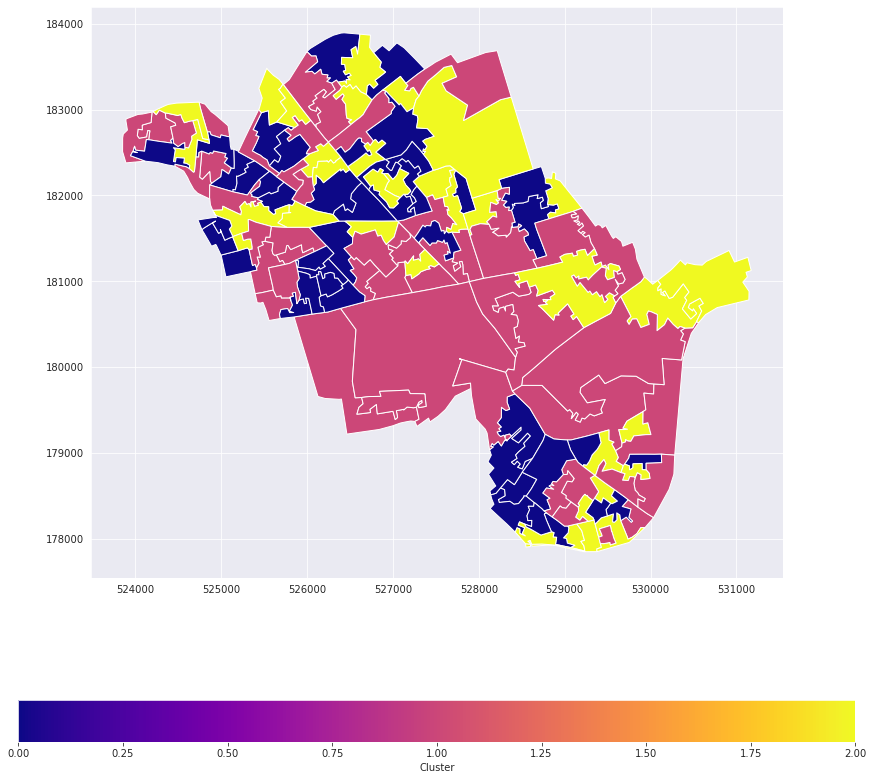

In [100]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

lsoa_daily_label_gdf.plot(column='cluster', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});

## 4 Repeat Complaints and their Location 

* 尝试找出高频的点位

In [277]:
noise_test_true

,Noise_Complaint_Index,Time,Received_Date,Financial_Year,Service_Request,Service_Request_Group_Type,Service_Request_Group_Sub_Type,Service_Request_1,Address_Key_,Type_of_Address,...,LSOA_2011_Code,LSOA_2011_Name,Ward_Name,Date,Year_Month,Year,Month,Weekday,Season,Category_by
0,NC1,0,4/1/2018,2018/19,Burglar/fire alarm,Noise Complaint,Property Alarm,Burglar/fire alarm,AD1,ADDRESS,...,E01004736,Westminster 018C,St James's,2018-04-01,2018-04,2018,4,6,2,4
1,NC2,0,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD2,ADDRESS,...,E01004745,Westminster 021C,Vincent Square,2018-04-01,2018-04,2018,4,6,2,4
2,NC3,0,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD3,ADDRESS,...,E01004667,Westminster 023C,Knightsbridge & Belgravia,2018-04-01,2018-04,2018,4,6,2,4
3,NC4,0,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD4,ADDRESS,...,E01004694,Westminster 016C,Lancaster Gate,2018-04-01,2018-04,2018,4,6,2,4
4,NC5,2,4/1/2018,2018/19,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD5,ADDRESS,...,E01033596,Westminster 013F,West End,2018-04-01,2018-04,2018,4,6,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90793,NC90794,22,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD27872,ADDRESS,...,E01004715,Westminster 013A,West End,2022-05-24,2022-05,2022,5,1,2,5
90794,NC90795,23,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD27873,ADDRESS,...,E01004695,Westminster 017C,Lancaster Gate,2022-05-24,2022-05,2022,5,1,2,5
90795,NC90796,23,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD6625,ADDRESS,...,E01004762,Westminster 011E,West End,2022-05-24,2022-05,2022,5,1,2,5
90796,NC90797,23,5/24/2022,2022/23,Residential noise,Noise Complaint,Residential Premises,Residential noise,AD26114,ADDRESS,...,E01004699,Westminster 017F,Bayswater,2022-05-24,2022-05,2022,5,1,2,5


In [278]:
# Summarize by date
noise_test_true_address = noise_test_true.groupby(['Address_Key_','LSOA_2011_Code']).count()[['Noise_Complaint_Index']].reset_index()
noise_test_true_address_complaint = noise_test_true_address.loc[noise_test_true_address.Noise_Complaint_Index > 100]
len(noise_test_true_address_complaint)

46

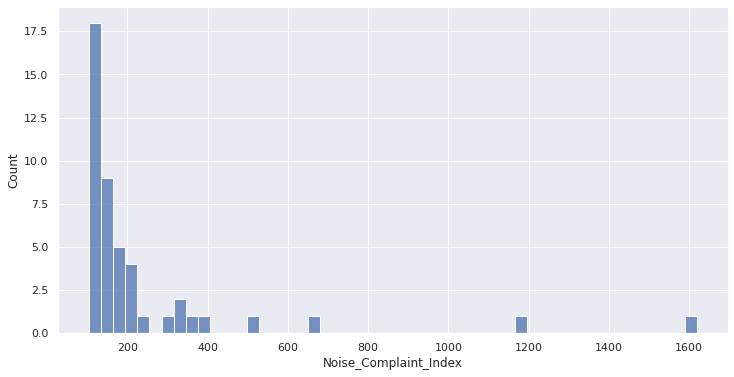

In [279]:
# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style="darkgrid")

plt.figure(figsize=(12,6))
ax = sns.histplot(data=noise_test_true_address_complaint, x="Noise_Complaint_Index",bins = 50)
plt.show()

In [280]:
noise_test_true_address_complaint_gdf = lsoa_gdf.merge(noise_test_true_address_complaint, left_on = 'LSOA11CD', right_on = 'LSOA_2011_Code')

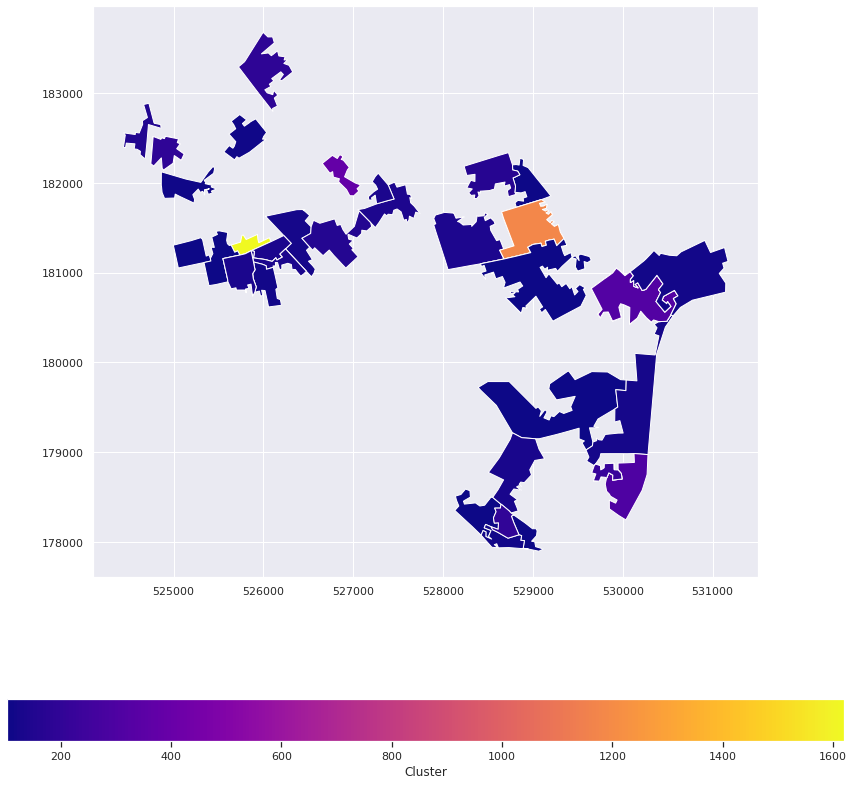

In [281]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1,figsize=(15,15))

noise_test_true_address_complaint_gdf.plot(column='Noise_Complaint_Index', ax=ax, cmap = 'plasma', legend=True,legend_kwds={'label': "Cluster",
                        'orientation': "horizontal"});